#MILESTONE1

# 1. Business Background

As a data analyst at Mutual Fund Investment Application Startup, I've been given problem by my user, Mr.Djoko, to solve with data.

His question is,

*What kinds of thematic campaigns that we can recommend to the marketing team for the next month?*

Next month, the marketing team wants to create a thematic campaign based on user preference. I am tasked to create segmentation for this thematic campaign and give recommendations on the themes on each campaign.

# 2. Preparation

## Import Library

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

## Dataset List

In [ ]:
url1 = 'https://docs.google.com/spreadsheets/d/1Y4EdCS6DgdflozgD38mMZf3L9_CG8AYXvNQ6mA5Nrr8/edit#gid=0'
url2 = 'https://docs.google.com/spreadsheets/d/1pM6N_8z_-n2GOLmHNr5pAR9OcfV2cyL5-UIf7L3yfPE/edit#gid=0'

url1_trf = url1.replace('/edit#gid=', '/export?format=csv&gid=')
url2_trf = url2.replace('/edit#gid=', '/export?format=csv&gid=')

## Import Datasets

In [ ]:
df_dirty_user = pd.read_csv(url1_trf)
df_dirty_transaction = pd.read_csv(url2_trf)

In [ ]:
df_dirty_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14712 entries, 0 to 14711
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   user_id                       14712 non-null  int64 
 1   registration_import_datetime  14712 non-null  object
 2   user_gender                   14712 non-null  object
 3   user_age                      14712 non-null  int64 
 4   user_occupation               14712 non-null  object
 5   user_income_range             14712 non-null  object
 6   referral_code_used            5604 non-null   object
 7   user_income_source            14712 non-null  object
 8   end_of_month_invested_amount  14712 non-null  int64 
 9   total_buy_amount              14712 non-null  int64 
 10  total_sell_amount             14712 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 1.2+ MB


In [ ]:
df_dirty_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   158811 non-null  int64  
 1   date                                      158811 non-null  object 
 2   buy_saham_transaction_amount              99031 non-null   float64
 3   sell_saham_transaction_amount             1808 non-null    float64
 4   buy_pasar_uang_transaction_amount         122263 non-null  float64
 5   sell_pasar_uang_transaction_amount        2010 non-null    float64
 6   buy_pendapatan_tetap_transaction_amount   98916 non-null   float64
 7   sell_pendapatan_tetap_transaction_amount  1581 non-null    float64
 8   buy_campuran_transaction_amount           5072 non-null    float64
 9   sell_campuran_transaction_amount          46 non-null      float64
 10  total_buy_transactio

# 3. Data Cleaning (for merging purpose)

## General View on Both of The Data

### User Dataset

In [ ]:
df_dirty_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14712 entries, 0 to 14711
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   user_id                       14712 non-null  int64 
 1   registration_import_datetime  14712 non-null  object
 2   user_gender                   14712 non-null  object
 3   user_age                      14712 non-null  int64 
 4   user_occupation               14712 non-null  object
 5   user_income_range             14712 non-null  object
 6   referral_code_used            5604 non-null   object
 7   user_income_source            14712 non-null  object
 8   end_of_month_invested_amount  14712 non-null  int64 
 9   total_buy_amount              14712 non-null  int64 
 10  total_sell_amount             14712 non-null  int64 
dtypes: int64(5), object(6)
memory usage: 1.2+ MB


### Daily User Transaction Dataset

In [ ]:
df_dirty_transaction.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   158811 non-null  int64  
 1   date                                      158811 non-null  object 
 2   buy_saham_transaction_amount              99031 non-null   float64
 3   sell_saham_transaction_amount             1808 non-null    float64
 4   buy_pasar_uang_transaction_amount         122263 non-null  float64
 5   sell_pasar_uang_transaction_amount        2010 non-null    float64
 6   buy_pendapatan_tetap_transaction_amount   98916 non-null   float64
 7   sell_pendapatan_tetap_transaction_amount  1581 non-null    float64
 8   buy_campuran_transaction_amount           5072 non-null    float64
 9   sell_campuran_transaction_amount          46 non-null      float64
 10  total_buy_transactio

## Handling Missing Data on Key Column (user_id)

### User Dataset

In [ ]:
df_dirty_user['user_id'].isna().sum()

0

### Daily User Transaction Dataset

In [ ]:
df_dirty_transaction['user_id'].isna().sum()

0

## Handling Duplicates on Key Column (user_id)

### User Dataset

In [ ]:
df_dirty_user[df_dirty_user.duplicated(subset='user_id')]

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,end_of_month_invested_amount,total_buy_amount,total_sell_amount


In [ ]:
df_dirty_user['user_id'].nunique()

14712

### Daily User Transaction Dataset

In [ ]:
df_dirty_transaction[df_dirty_transaction.duplicated(subset=['user_id'])]

,user_id,date,buy_saham_transaction_amount,sell_saham_transaction_amount,buy_pasar_uang_transaction_amount,sell_pasar_uang_transaction_amount,buy_pendapatan_tetap_transaction_amount,sell_pendapatan_tetap_transaction_amount,buy_campuran_transaction_amount,sell_campuran_transaction_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,NaN,NaN,10000000.0,10000000
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,NaN,NaN,10000000.0,10000000
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,NaN,NaN,10000000.0,10000000
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,NaN,NaN,10000000.0,10000000
5,50701,2021-09-06,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0,0,NaN,NaN,NaN,10000000.0,10000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158732,4157033,2021-09-30,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0,0,NaN,0.0,NaN,NaN,0
158734,4157054,2021-09-30,NaN,NaN,NaN,-10000.0,NaN,NaN,NaN,NaN,0,-10000,NaN,0.0,NaN,NaN,0
158737,4157117,2021-09-30,NaN,NaN,NaN,-10000.0,NaN,NaN,NaN,NaN,0,-10000,NaN,0.0,NaN,NaN,0
158739,4157132,2021-09-30,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0,0,NaN,10000.0,NaN,NaN,10000


In [ ]:
df_dirty_transaction.duplicated(subset=['user_id']).value_counts()

True     150534
False      8277
dtype: int64

In [ ]:
df_dirty_transaction[df_dirty_transaction.duplicated(subset=['user_id','date'])]

,user_id,date,buy_saham_transaction_amount,sell_saham_transaction_amount,buy_pasar_uang_transaction_amount,sell_pasar_uang_transaction_amount,buy_pendapatan_tetap_transaction_amount,sell_pendapatan_tetap_transaction_amount,buy_campuran_transaction_amount,sell_campuran_transaction_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount


In [ ]:
df_dirty_transaction['user_id'].nunique()

8277

## Handling Typos and Incorrect Data Types on Key Column (user_id)

### User Dataset

In [ ]:
df_dirty_user['user_id'].dtype

dtype('int64')

### Daily User Transaction Dataset

In [ ]:
df_dirty_transaction['user_id'].dtype

dtype('int64')

## Data is clean enough for merging, assign to new variable

In [ ]:
df_canmerge_user = df_dirty_user.copy()
df_canmerge_transaction = df_dirty_transaction.copy()

# 4. Merging Datasets

In [ ]:
df_dirty_merged = df_canmerge_user.merge(df_canmerge_transaction, how='left', left_on='user_id', right_on='user_id')

In [ ]:
df_dirty_merged.head()

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,end_of_month_invested_amount,total_buy_amount,...,sell_pendapatan_tetap_transaction_amount,buy_campuran_transaction_amount,sell_campuran_transaction_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount
0,162882,2021-09-17 14:10:44,Female,51,Swasta,> Rp 500 Juta - 1 Miliar,NaN,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3485491,2021-10-09 11:11:34,Female,55,Others,> Rp 50 Juta - 100 Juta,NaN,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,Rp 10 Juta - 50 Juta,NaN,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3816789,2021-08-12 07:19:32,Female,53,IRT,> Rp 50 Juta - 100 Juta,NaN,Gaji,600000,100000,...,NaN,NaN,NaN,0.0,0.0,190000.0,40000.0,270000.0,NaN,500000.0
4,3816789,2021-08-12 07:19:32,Female,53,IRT,> Rp 50 Juta - 100 Juta,NaN,Gaji,600000,100000,...,NaN,NaN,NaN,0.0,0.0,190000.0,40000.0,270000.0,NaN,500000.0


In [ ]:
df_dirty_merged.shape

(165246, 27)

In [ ]:
df_dirty_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        54020 non-null   object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  int64  
 9   total_buy_amount                          165246 non-null  int64  
 10  total_sell_amount   

# 5. Data Cleaning (continued)

## Handling Mising Data

### referral_code_used

In [ ]:
df_dirty_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        54020 non-null   object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  int64  
 9   total_buy_amount                          165246 non-null  int64  
 10  total_sell_amount   

In [ ]:
df_dirty_merged['referral_code_used'].isna().sum()

111226

In [ ]:
df_dirty_merged['referral_code_used'].value_counts()

used referral    54020
Name: referral_code_used, dtype: int64

In [ ]:
df_dirty_merged['referral_code_used'].fillna('no', inplace=True)

In [ ]:
df_dirty_merged['referral_code_used'].replace(to_replace='used referral', value='yes', inplace=True)

In [ ]:
df_dirty_merged['referral_code_used'].value_counts()

no     111226
yes     54020
Name: referral_code_used, dtype: int64

### date

In [ ]:
# Assign to a new var to signify no missing at referral_code_used
df_nmrcu = df_dirty_merged.copy()

In [ ]:
df_nmrcu.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        165246 non-null  object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  int64  
 9   total_buy_amount                          165246 non-null  int64  
 10  total_sell_amount   

In [ ]:
df_nmrcu.columns

Index(['user_id', 'registration_import_datetime', 'user_gender', 'user_age',
       'user_occupation', 'user_income_range', 'referral_code_used',
       'user_income_source', 'end_of_month_invested_amount',
       'total_buy_amount', 'total_sell_amount', 'date',
       'buy_saham_transaction_amount', 'sell_saham_transaction_amount',
       'buy_pasar_uang_transaction_amount',
       'sell_pasar_uang_transaction_amount',
       'buy_pendapatan_tetap_transaction_amount',
       'sell_pendapatan_tetap_transaction_amount',
       'buy_campuran_transaction_amount', 'sell_campuran_transaction_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount'],
      dtype='object')

In [ ]:
df_nmrcu['date'].isna().sum()

6435

In [ ]:
df_nmrcu['date'].value_counts()

2021-09-30    8277
2021-09-29    8007
2021-09-28    7593
2021-09-27    7416
2021-09-24    7257
2021-09-23    7094
2021-09-22    6921
2021-09-21    6488
2021-09-20    6368
2021-09-17    6190
2021-09-16    6024
2021-09-15    5841
2021-09-14    5405
2021-09-13    5237
2021-09-10    5038
2021-09-09    4862
2021-09-08    4674
2021-09-07    4200
2021-09-06    4032
2021-09-03    3830
2021-09-02    3584
2021-09-01    3428
2021-08-31    3075
2021-08-30    2926
2021-08-27    2774
2021-08-26    2643
2021-08-25    2528
2021-08-24    2227
2021-08-23    2095
2021-08-20    1973
2021-08-19    1768
2021-08-17    1474
2021-08-18    1474
2021-08-16    1350
2021-08-13    1117
2021-08-11     991
2021-08-12     991
2021-08-10     577
2021-08-09     426
2021-08-06     315
2021-08-05     204
2021-08-04     117
Name: date, dtype: int64

In [ ]:
df_nmrcu[df_nmrcu['date'].isna()].head()

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,end_of_month_invested_amount,total_buy_amount,...,sell_pendapatan_tetap_transaction_amount,buy_campuran_transaction_amount,sell_campuran_transaction_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount
0,162882,2021-09-17 14:10:44,Female,51,Swasta,> Rp 500 Juta - 1 Miliar,no,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3485491,2021-10-09 11:11:34,Female,55,Others,> Rp 50 Juta - 100 Juta,no,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,Rp 10 Juta - 50 Juta,no,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
74,1407611,2021-09-23 20:55:59,Male,56,Swasta,> Rp 100 Juta - 500 Juta,no,Keuntungan Bisnis,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128,3820348,2021-08-12 20:40:15,Male,47,Pengusaha,> Rp 100 Juta - 500 Juta,no,Gaji,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_nmrcu.loc[df_nmrcu['user_id']==162882,[
       'user_id', 'date', 'total_buy_amount', 'total_sell_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount']]
#maybe date NaN indicates that the user never make transaction in the app so far(?)

,user_id,date,total_buy_amount,total_sell_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount
0,162882,NaN,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_nmrcu.loc[(df_nmrcu['date'].isna()) & (df_nmrcu['total_invested_amount'].notna()),[
       'user_id', 'date', 'total_buy_amount', 'total_sell_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount'
]]

,user_id,date,total_buy_amount,total_sell_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount


In [ ]:
df_nmrcu.loc[(df_nmrcu['date'].isna()) & (df_nmrcu['total_buy_transaction_amount'].notna()),[
       'user_id', 'date', 'total_buy_amount', 'total_sell_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount'
]].head()

,user_id,date,total_buy_amount,total_sell_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount


In [ ]:
df_nmrcu.loc[(df_nmrcu['date'].isna()) & (df_nmrcu['total_sell_transaction_amount'].notna()),[
       'user_id', 'date', 'total_buy_amount', 'total_sell_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount'
]].head()
# From the data, I can conclude that NaN in date indicates that the user is registered but
# never make transaction in the app

,user_id,date,total_buy_amount,total_sell_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount


In [ ]:
#Inspecting on date is complete
df_nmdate = df_nmrcu.copy()

### all int or float

In [ ]:
df_nmdate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        165246 non-null  object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  int64  
 9   total_buy_amount                          165246 non-null  int64  
 10  total_sell_amount   

In [ ]:
df_nmdate.columns

Index(['user_id', 'registration_import_datetime', 'user_gender', 'user_age',
       'user_occupation', 'user_income_range', 'referral_code_used',
       'user_income_source', 'end_of_month_invested_amount',
       'total_buy_amount', 'total_sell_amount', 'date',
       'buy_saham_transaction_amount', 'sell_saham_transaction_amount',
       'buy_pasar_uang_transaction_amount',
       'sell_pasar_uang_transaction_amount',
       'buy_pendapatan_tetap_transaction_amount',
       'sell_pendapatan_tetap_transaction_amount',
       'buy_campuran_transaction_amount', 'sell_campuran_transaction_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount'],
      dtype='object')

In [ ]:
df_nmdate['buy_saham_transaction_amount'].isna().sum()

66215

In [ ]:
# for i in df_nmdate.columns:
#   if df_nmdate[i].dtype == 'float64':
#     df_nmdate[i].fillna(0, inplace=True)

# df_nmdate.info()

In [ ]:
df_nmdate['user_id'].astype('category')

0          162882
1         3485491
2         1071649
3         3816789
4         3816789
           ...   
165241    4352347
165242    4288026
165243    4286882
165244    4396739
165245    4401986
Name: user_id, Length: 165246, dtype: category
Categories (14712, int64): [43195, 47757, 50701, 50961, ..., 4457532, 4457596, 4457622, 4457700]

In [ ]:
for i in df_nmdate.columns:
  if df_nmdate[i].dtype == 'int64':
    if (i == 'user_age') or (i == 'user_id'):
      continue
    else:
      df_nmdate[i] = df_nmdate[i].astype('float')

In [ ]:
df_nmdate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        165246 non-null  object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  float64
 9   total_buy_amount                          165246 non-null  float64
 10  total_sell_amount   

In [ ]:
df_nm = df_nmdate.copy()

## Handling Duplicates

In [ ]:
df_nm[df_nm.duplicated()].head()

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,end_of_month_invested_amount,total_buy_amount,...,sell_pendapatan_tetap_transaction_amount,buy_campuran_transaction_amount,sell_campuran_transaction_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount


In [ ]:
df_nm.loc[df_nm.duplicated(subset=['user_id','registration_import_datetime','date']), [
       'user_id', 'date',
       'buy_saham_transaction_amount', 'sell_saham_transaction_amount',
       'buy_pasar_uang_transaction_amount',
       'sell_pasar_uang_transaction_amount',
       'buy_pendapatan_tetap_transaction_amount',
       'sell_pendapatan_tetap_transaction_amount',
       'buy_campuran_transaction_amount', 'sell_campuran_transaction_amount',
       'total_buy_transaction_amount', 'total_sell_transaction_amount',
       'saham_invested_amount', 'pasar_uang_invested_amount',
       'pendapatan_tetap_invested_amount', 'campuran_invested_amount',
       'total_invested_amount'
]]
#No duplicates identified

,user_id,date,buy_saham_transaction_amount,sell_saham_transaction_amount,buy_pasar_uang_transaction_amount,sell_pasar_uang_transaction_amount,buy_pendapatan_tetap_transaction_amount,sell_pendapatan_tetap_transaction_amount,buy_campuran_transaction_amount,sell_campuran_transaction_amount,total_buy_transaction_amount,total_sell_transaction_amount,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount,total_invested_amount


In [ ]:
df_nodup = df_nm.copy()

## Handling Typos

In [ ]:
df_nodup.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        165246 non-null  object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  float64
 9   total_buy_amount                          165246 non-null  float64
 10  total_sell_amount   

In [ ]:
for i in df_nodup.columns:
  if df_nodup[i].dtype == 'object':
    print(df_nodup[i].value_counts())
#no typos identified

2021-08-02 13:38:02    164
2021-08-01 11:28:14    162
2021-08-10 10:55:26    143
2021-08-09 12:02:03    138
2021-08-05 10:18:13    132
                      ... 
2021-10-26 13:03:38      1
2021-09-28 20:52:15      1
2021-10-08 11:56:55      1
2021-10-21 12:16:49      1
2021-10-22 00:55:26      1
Name: registration_import_datetime, Length: 11536, dtype: int64
Male      100950
Female     64296
Name: user_gender, dtype: int64
Pelajar       92279
Swasta        37273
Others        16567
IRT            8579
Pengusaha      6109
PNS            2636
Guru           1149
TNI/Polisi      549
Pensiunan       105
Name: user_occupation, dtype: int64
< 10 Juta                   71248
Rp 10 Juta - 50 Juta        51959
> Rp 50 Juta - 100 Juta     27536
> Rp 100 Juta - 500 Juta    13125
> Rp 500 Juta - 1 Miliar     1019
> Rp 1 Miliar                 359
Name: user_income_range, dtype: int64
no     111226
yes     54020
Name: referral_code_used, dtype: int64
Gaji                     103600
Undian          

## Handling Incorrect Data type

### Change to datetime

In [ ]:
df_chgdate = df_nodup.copy()

In [ ]:
df_chgdate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   user_id                                   165246 non-null  int64  
 1   registration_import_datetime              165246 non-null  object 
 2   user_gender                               165246 non-null  object 
 3   user_age                                  165246 non-null  int64  
 4   user_occupation                           165246 non-null  object 
 5   user_income_range                         165246 non-null  object 
 6   referral_code_used                        165246 non-null  object 
 7   user_income_source                        165246 non-null  object 
 8   end_of_month_invested_amount              165246 non-null  float64
 9   total_buy_amount                          165246 non-null  float64
 10  total_sell_amount   

In [ ]:
df_chgdate['registration_import_datetime'] = pd.to_datetime(pd.to_datetime(df_chgdate['registration_import_datetime']).dt.strftime('%Y-%m-%d'))

In [ ]:
df_chgdate['date'] = pd.to_datetime(pd.to_datetime(df_chgdate['date']).dt.strftime('%Y-%m-%d'))

In [ ]:
df_chgdate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

# 5. Exploratory Data Analysis

In [ ]:
df_eda = df_chgdate.copy()

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

Descriptive Statistics:

1. How many users do we have in the data?

2. How many users in each category? (gender, occupation, referral code used, income, income source and each investment product)

3. What is the mean, median and data distribution of end of month invested amount?

4. How much is the amount of end of month investment per category?

5. How is the trend of investment in saham, pendapatan tetap, pasar uang and campuran also total investment amount?

### Descriptive information about numeric variable

In [ ]:
len(df_eda)

165246

In [ ]:
#Descriptive analysis after treating the outlier
pd.set_option('display.float_format', lambda x: '%.2f' % x)

numeric = []
for i in df_eda.columns:
  if (df_eda[i].dtype == 'int64') or (df_eda[i].dtype == 'float64'):
    if i == 'user_id':
      continue
    else:
      numeric.append(i)

df_eda_temp = df_eda.drop_duplicates(subset='user_id', keep='last')
desc_eda = df_eda_temp[numeric].describe()
desc_eda.loc['median'] = df_eda[numeric].median()
desc_eda.loc['kurtosis'] = df_eda[numeric].kurt() #show kurtosis statistic
desc_eda.loc['skewness'] = df_eda[numeric].skew() #show Skewness statistic
desc_eda.loc['variance'] = df_eda[numeric].var() #show variance statistic
desc_eda.T.round(2)

,count,mean,std,min,25%,50%,75%,max,median,kurtosis,skewness,variance
user_age,14712.00,27.18,8.55,17.00,21.00,25.00,31.00,83.00,25.00,2.52,1.52,73.58
end_of_month_invested_amount,14712.00,1445996.23,19073876.65,0.00,0.00,0.00,125000.00,1012200000.00,100000.00,812.34,26.11,758305980142983.88
total_buy_amount,14712.00,842752.13,12897431.97,0.00,0.00,0.00,0.00,799500000.00,0.00,990.59,28.75,430926932773249.62
total_sell_amount,14712.00,-164862.89,2716128.69,-185000000.00,0.00,0.00,0.00,0.00,0.00,839.48,-26.66,22362479228128.44
buy_saham_transaction_amount,5189.00,20128.70,185903.20,0.00,0.00,0.00,0.00,6980000.00,0.00,7882.17,71.92,106637681845.26
sell_saham_transaction_amount,77.00,-238833.88,738835.95,-5000000.00,-100000.00,-50000.00,-20000.00,-10000.00,-60000.00,86.92,-7.98,536490965754.28
buy_pasar_uang_transaction_amount,6440.00,69549.85,1792782.16,0.00,0.00,0.00,0.00,100000000.00,0.00,23429.05,133.55,1776416688843.79
sell_pasar_uang_transaction_amount,79.00,-92877.52,320391.85,-2283012.00,-30000.00,-10000.00,-10000.00,-10000.00,-20000.00,966.90,-28.83,25498237621220.98
buy_pendapatan_tetap_transaction_amount,5215.00,44444.88,657082.02,0.00,0.00,0.00,0.00,25000000.00,0.00,11133.25,96.62,8632476242120.99
sell_pendapatan_tetap_transaction_amount,69.00,-914810.26,4917880.15,-30000000.00,-90000.00,-40000.00,-30000.00,-10000.00,-50500.00,439.24,-19.22,12852098373919.65


In [ ]:
df_eda_temp['date'].value_counts()

2021-09-30    8277
Name: date, dtype: int64

Insight:

1. There are 14712 users in the data.

2. 5453 users have invested in Saham, 6808 users have invested in Pasar Uang, 5449 users have invested in Pendapatan Tetap and 235 users have invested in Campuran.

## How many users do we have in the data?

In [ ]:
pd.set_option('display.float_format', lambda x: '%.0f' % x)
df_eda_temp['user_id'].astype('category').describe()

#There are 14712 users registered that have clean data

count     14712
unique    14712
top       43195
freq          1
Name: user_id, dtype: int64

In [ ]:
(df_eda_temp['end_of_month_invested_amount'].value_counts(normalize=True)*100)

0           58
100000       8
10000        5
200000       3
500000       2
            ..
900000000    0
3275000      0
1730000      0
251604       0
71100000     0
Name: end_of_month_invested_amount, Length: 1042, dtype: float64

In [ ]:
sns.set_theme()

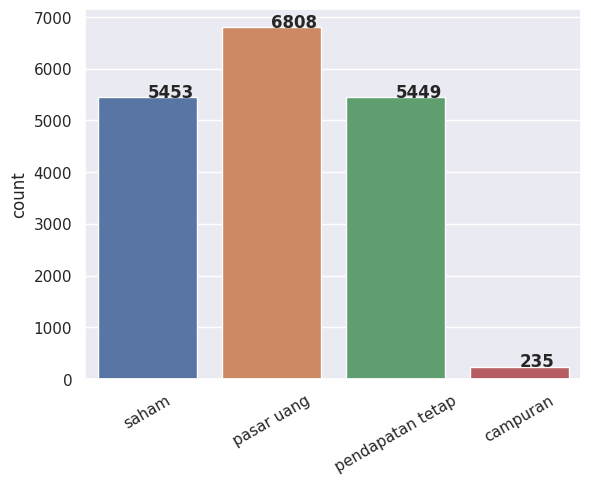

In [ ]:
df_product_count = df_eda_temp[['saham_invested_amount', 'pasar_uang_invested_amount', 'pendapatan_tetap_invested_amount', 'campuran_invested_amount']].count().to_frame().rename(columns={0:'count'})
sns.barplot(data=df_product_count, x=df_product_count.index, y='count')

for a, b in enumerate(df_product_count['count']):
  text = plt.text(a, b, str(round(b,1)), fontweight='bold', fontsize=12)

plt.xticks([0,1,2,3], ['saham', 'pasar uang', 'pendapatan tetap', 'campuran'], rotation=30)
plt.show()

## End of month investment average per product

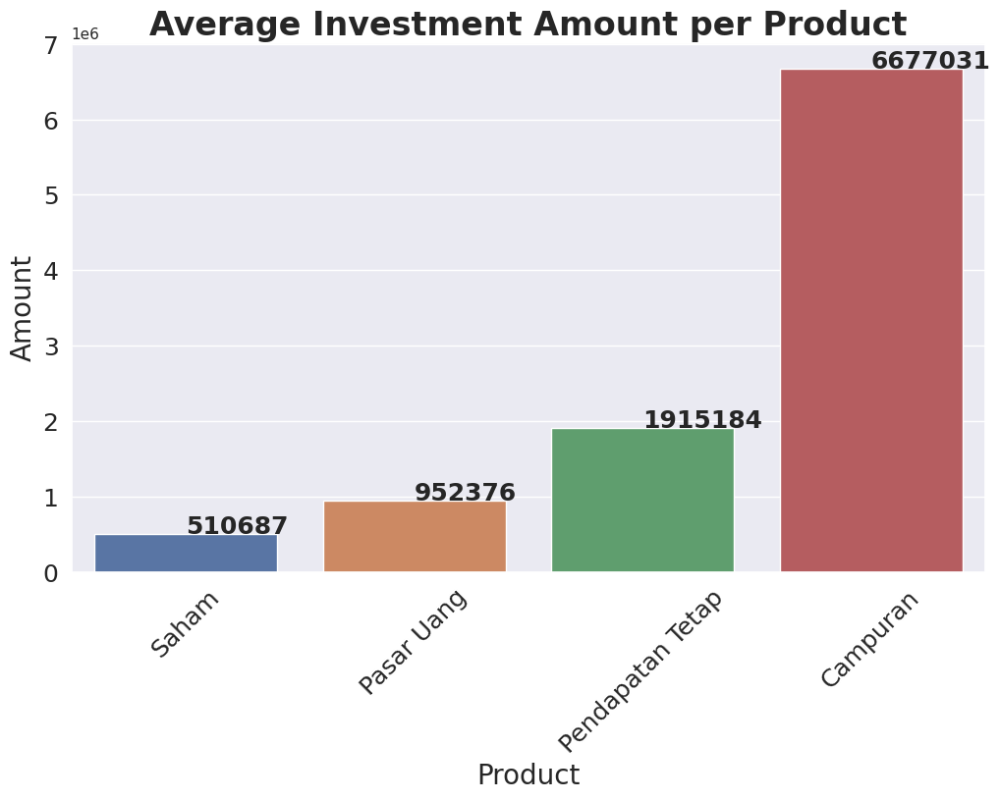

In [ ]:
product = ['saham_invested_amount', 'pasar_uang_invested_amount', 'pendapatan_tetap_invested_amount', 'campuran_invested_amount']
fig,ax = plt.subplots(figsize=(12,7))

group = df_eda_temp[product].mean().to_frame()

sns.barplot(x=group.index, y=group[0], data=group)
ax.set_title('Average Investment Amount per Product',fontsize=24, fontweight='bold')
for a, b in enumerate(group[0]):
  text = plt.text(a, b, str(round(b)), fontweight='bold', fontsize=18)
ax.set_xticklabels(['Saham', 'Pasar Uang', 'Pendapatan Tetap', 'Campuran'])
ax.tick_params(axis='x', labelsize=18, labelrotation=45)
ax.set_xlabel("Product", fontsize=20)
ax.tick_params(axis='y', labelsize=18)
ax.set_ylabel("Amount", fontsize=20)
plt.show()

## How many users in each category? (gender, occupation, referral code used, income and income source)

In [ ]:
for i in df_eda_temp.columns:
  if (df_eda_temp[i].dtype == 'object'):
    display(df_eda_temp[i].value_counts().to_frame())
    print('\n')

,user_gender
Male,8977
Female,5735


,user_occupation
Pelajar,7887
Swasta,3263
Others,1683
IRT,934
Pengusaha,598
PNS,191
Guru,106
TNI/Polisi,45
Pensiunan,5


,user_income_range
< 10 Juta,6275
Rp 10 Juta - 50 Juta,4816
> Rp 50 Juta - 100 Juta,2390
> Rp 100 Juta - 500 Juta,1114
> Rp 500 Juta - 1 Miliar,90
> Rp 1 Miliar,27


,referral_code_used
no,9108
yes,5604


,user_income_source
Gaji,9131
Keuntungan Bisnis,1908
Dari Orang Tua / Anak,1307
Undian,1001
Tabungan,419
Lainnya,414
Dari Suami / istri,300
Hasil Investasi,165
Warisan,43
Bunga Simpanan,24


In [ ]:
catlist = []
for i in df_eda_temp.columns:
  if (df_eda_temp[i].dtype == 'object'):
    catlist.append(i)
df_eda_temp[catlist].describe()

,user_gender,user_occupation,user_income_range,referral_code_used,user_income_source
count,14712,14712,14712,14712,14712
unique,2,9,6,2,10
top,Male,Pelajar,< 10 Juta,no,Gaji
freq,8977,7887,6275,9108,9131


<Axes: xlabel='user_age', ylabel='Count'>

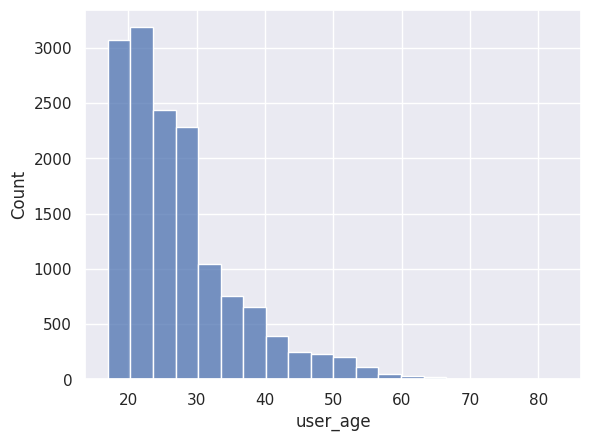

In [ ]:
sns.histplot(data=df_eda_temp, x='user_age', bins=20)

In [ ]:
df_eda_temp[['user_age']].to_csv('file.csv')

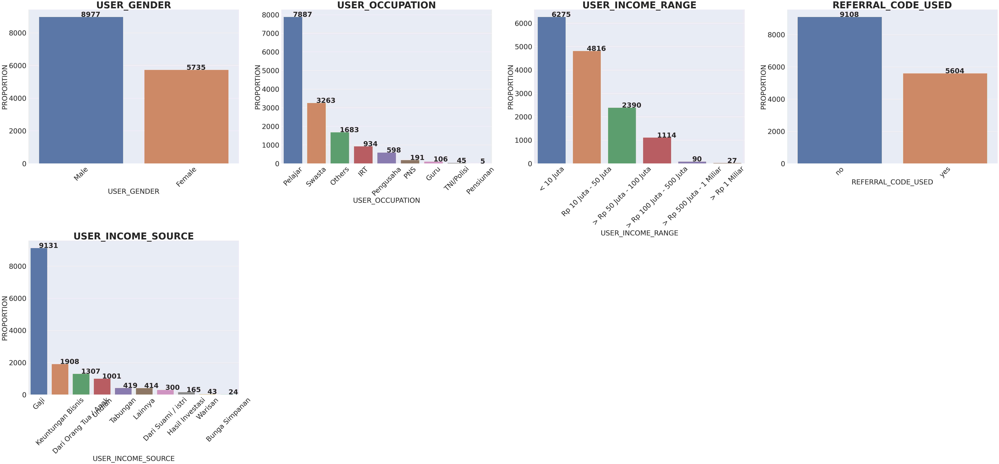

In [ ]:
fig = plt.figure(figsize=(90,36))
n = 1
for i,col in enumerate(df_eda_temp.columns):
  if (df_eda_temp[col].dtype == 'object'):
    ax = fig.add_subplot(2,4,n)
    n+=1
    ax.set_title(str(col).upper(),fontsize=48, fontweight='bold')
    group = (df_eda_temp[col].value_counts()).to_frame()
    for a, b in enumerate(group[col]):
      text = plt.text(a, b, str(round(b,1)), fontweight='bold', fontsize=36)
    sns.barplot(x=group.index, y=group[col], data=group)
    ax.tick_params(axis='x', labelsize=36, labelrotation=45)
    ax.set_xlabel(str(col).upper(), fontsize=36)
    ax.tick_params(axis='y', labelsize=36)
    ax.set_ylabel('PROPORTION', fontsize=36)
  plt.subplots_adjust(hspace=0.5)
plt.savefig('plot0.png', dpi=200, bbox_inches='tight')

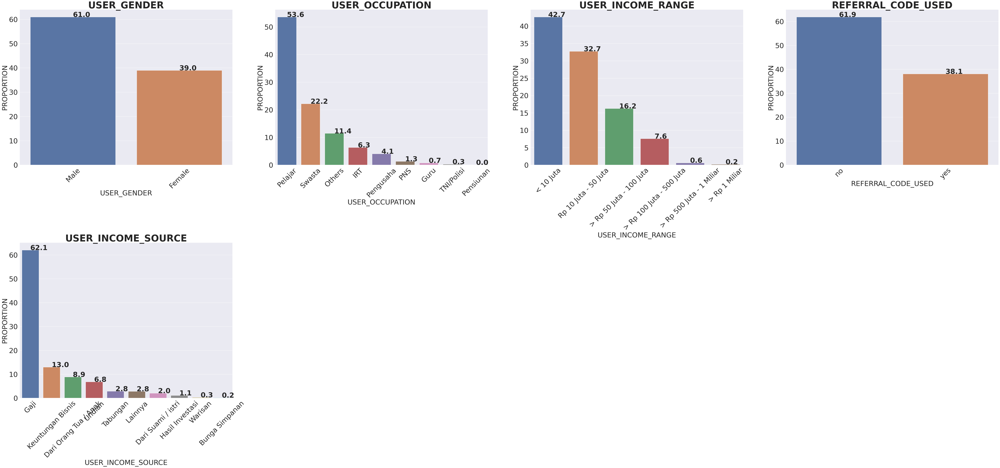

In [ ]:
fig = plt.figure(figsize=(90,36))
n = 1
for i,col in enumerate(df_eda_temp.columns):
  if (df_eda_temp[col].dtype == 'object'):
    ax = fig.add_subplot(2,4,n)
    n+=1
    ax.set_title(str(col).upper(),fontsize=48, fontweight='bold')
    group = (df_eda_temp[col].value_counts(normalize=True)*100).to_frame()
    for a, b in enumerate(group[col]):
      text = plt.text(a, b, str(round(b,1)), fontweight='bold', fontsize=36)
    sns.barplot(x=group.index, y=group[col], data=group)
    ax.tick_params(axis='x', labelsize=36, labelrotation=45)
    ax.set_xlabel(str(col).upper(), fontsize=36)
    ax.tick_params(axis='y', labelsize=36)
    ax.set_ylabel('PROPORTION', fontsize=36)
  plt.subplots_adjust(hspace=0.5)
plt.savefig('plot0.png', dpi=200, bbox_inches='tight')

## End of month investment by each category

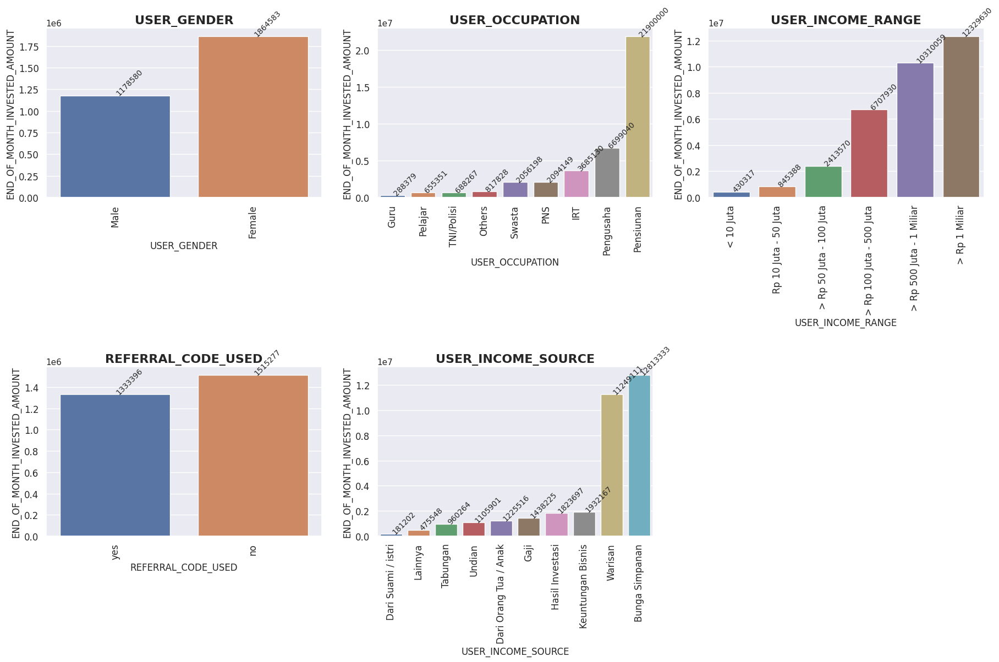

In [ ]:
fig = plt.figure(figsize=(22,12))
y = 'end_of_month_invested_amount'

pd.set_option('display.float_format', lambda x: '%.2f' % x)

for i, col in enumerate(catlist, start=1):
  if col == y:
    continue
  ax = fig.add_subplot(2,3,i)
  ax.set_title(str(col).upper(),fontsize=16, fontweight='bold')
  group = df_eda_temp[[col, y]]
  group = group.groupby(col).mean().sort_values(by=y)
  for a, b in enumerate(group[y]):
    text = plt.text(a, b, str(round(b)), fontsize=10, rotation=45)
  sns.barplot(x=group.index, y=group[y], data=group)
  ax.tick_params(axis='x', labelsize=12, labelrotation=90)
  ax.set_xlabel(str(col).upper(), fontsize=12)
  ax.tick_params(axis='y', labelsize=12)
  ax.set_ylabel(str(y).upper(), fontsize=12)
plt.subplots_adjust(hspace=1)
plt.savefig('plot1.png', dpi=200, bbox_inches='tight')

## How is the trend of investment in saham, pendapatan tetap, pasar uang and campuran also total investment amount?

In [ ]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

In [ ]:
group = df_eda.groupby('date')['total_invested_amount'].mean().to_frame()
display(group)

,total_invested_amount
date,
2021-08-04,462891.68
2021-08-05,631205.88
2021-08-06,910898.27
2021-08-09,1275719.41
2021-08-10,850839.13
2021-08-11,2029448.27
2021-08-12,2015995.69
2021-08-13,2273990.14
2021-08-16,2402039.56


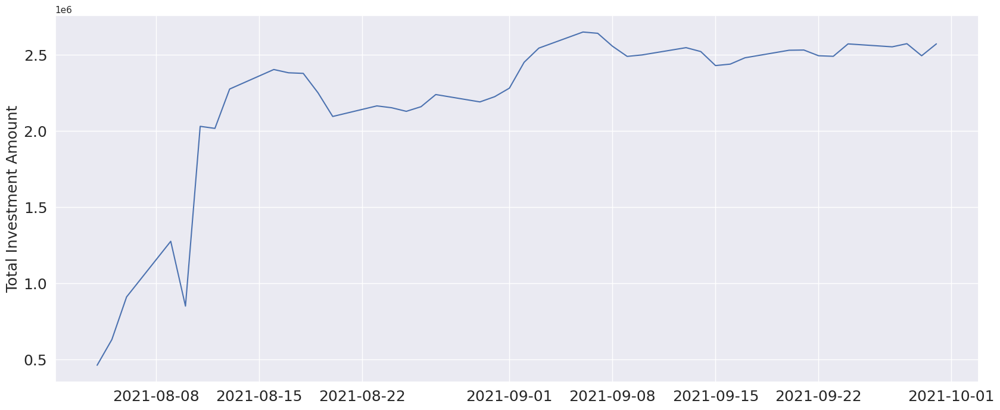

In [ ]:
plt.figure(figsize =(20, 8))
sns.lineplot(data = group, x=group.index, y = 'total_invested_amount')
plt.xticks(fontsize=18)
plt.xlabel(xlabel='')

plt.yticks(fontsize=18)
plt.ylabel(ylabel='Total Investment Amount', fontsize=18)

plt.savefig('plot2.png', dpi=200, bbox_inches='tight')
plt.show()

In [ ]:
product = ['saham_invested_amount', 'pasar_uang_invested_amount', 'pendapatan_tetap_invested_amount', 'campuran_invested_amount']
group = df_eda.groupby('date')[product].mean()
display(group)

,saham_invested_amount,pasar_uang_invested_amount,pendapatan_tetap_invested_amount,campuran_invested_amount
date,,,,
2021-08-04,273200.00,127732.23,142754.17,2200000.00
2021-08-05,233259.85,180268.06,322805.59,2230000.00
2021-08-06,253974.77,330333.90,480651.72,3126666.67
2021-08-09,273930.48,681503.63,476018.33,4777777.78
2021-08-10,256140.38,189030.28,459836.08,5747826.09
2021-08-11,353719.84,551484.76,1122570.24,12320855.82
2021-08-12,349575.50,545360.66,1113713.93,12320855.82
2021-08-13,375767.60,611474.90,1403274.62,12088668.81
2021-08-16,376231.06,551343.38,1786194.96,11564284.71


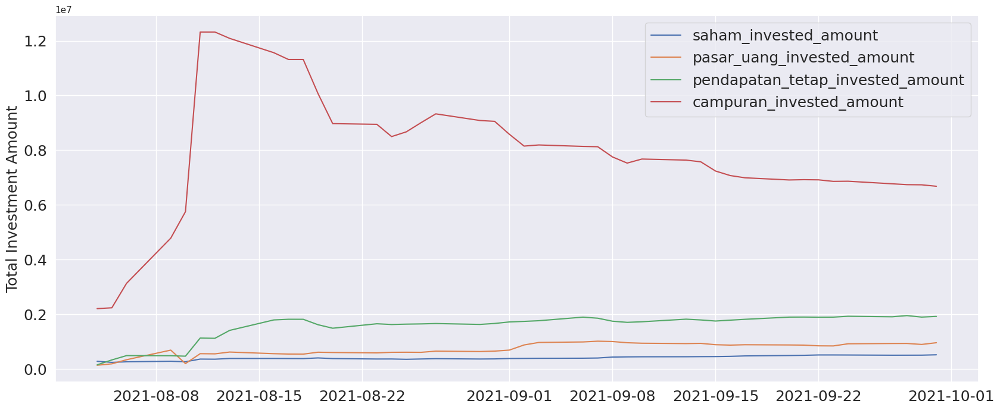

In [ ]:
#Create line chart
plt.figure(figsize =(20, 8))
axis =group.columns.tolist()
#axis.head()

for x in axis:
  plt.plot(group.index, group[x])

plt.xticks(fontsize=18)
plt.xlabel(xlabel='')

plt.yticks(fontsize=18)
plt.ylabel(ylabel='Total Investment Amount', fontsize=18)

plt.legend(group.columns, fontsize=18)

plt.savefig('plot3.png', dpi=200, bbox_inches='tight')
plt.show()

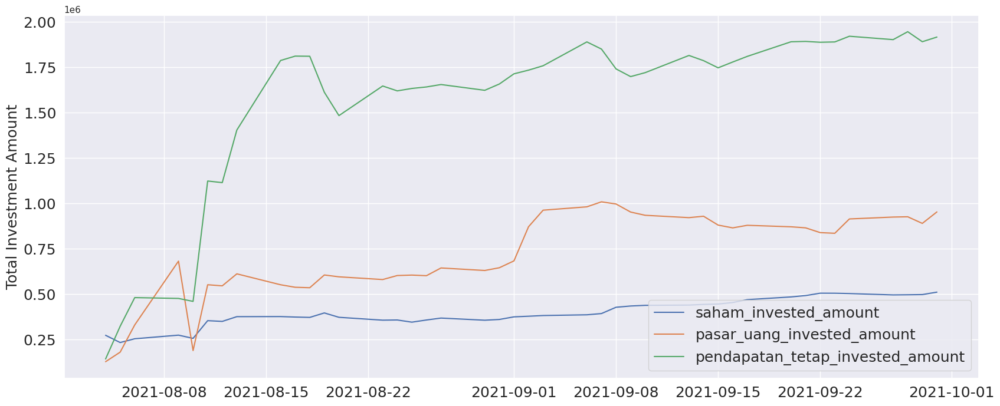

In [ ]:
#Create line chart
plt.figure(figsize =(20, 8))
axis =group.columns.tolist()
#axis.head()

for x in axis:
  if x != 'campuran_invested_amount':
    plt.plot(group.index, group[x])

plt.xticks(fontsize=18)
plt.xlabel(xlabel='')

plt.yticks(fontsize=18)
plt.ylabel(ylabel='Total Investment Amount', fontsize=18)

plt.legend(group.columns, fontsize=18,loc='lower right')

plt.savefig('plot4.png', dpi=200, bbox_inches='tight')
plt.show()

#MILESTONE2

# 6. Customer Segmentation

## Libraries

In [ ]:
# CLUSTER
from scipy import stats

from sklearn.cluster import KMeans, SpectralClustering                                             # to perform the k-means algorithm
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler,PowerTransformer,QuantileTransformer     # to scale different attribute
from sklearn.decomposition import PCA
from sklearn import cluster                                                    # for machine learning and statistical modelling (we use it for clustering)
from sklearn.pipeline import make_pipeline
from sklearn.manifold import TSNE

import matplotlib.cm as cm                                                     # provide a large set of colormaps(cm)
from sklearn.metrics import silhouette_samples, silhouette_score               # for perform silhoutte analysis
from sklearn.datasets import make_blobs                                        # Generate isotropic Gaussian blobs for clustering
from yellowbrick.cluster import SilhouetteVisualizer

##Feature Engineering and Selection

In [ ]:
df_segment = df_eda.copy()
df_segment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 27 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

In [ ]:
df_segment_last = df_segment.copy().sort_values(by=['user_id', 'date'], ascending=True).drop_duplicates(subset='user_id', keep='last')
df_segment_last.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14712 entries, 146296 to 108021
Data columns (total 27 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   user_id                                   14712 non-null  int64         
 1   registration_import_datetime              14712 non-null  datetime64[ns]
 2   user_gender                               14712 non-null  object        
 3   user_age                                  14712 non-null  int64         
 4   user_occupation                           14712 non-null  object        
 5   user_income_range                         14712 non-null  object        
 6   referral_code_used                        14712 non-null  object        
 7   user_income_source                        14712 non-null  object        
 8   end_of_month_invested_amount              14712 non-null  float64       
 9   total_buy_amount      

In [ ]:
df_segment_last['date'].value_counts()

2021-09-30    8277
Name: date, dtype: int64

In [ ]:
df_segment['date'] = pd.to_datetime(df_segment['date'].fillna('2021-09-30'))

In [ ]:
df_segment.fillna(0, inplace=True)

### Buy Frequency

In [ ]:
df_buyfreq = df_segment.copy().query("total_buy_transaction_amount!=0")[['user_id', 'date', 'total_buy_transaction_amount']]
df_buyfreq.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7808 entries, 25 to 165229
Data columns (total 3 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   user_id                       7808 non-null   int64         
 1   date                          7808 non-null   datetime64[ns]
 2   total_buy_transaction_amount  7808 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 244.0 KB


In [ ]:
df_buyfreq = df_buyfreq.groupby('user_id', as_index=False).agg('count')[['user_id', 'total_buy_transaction_amount']].rename(columns={'total_buy_transaction_amount':'buy_freq'})
df_segment = df_segment.merge(df_buyfreq, on='user_id', how='left')
df_segment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 28 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

In [ ]:
df_segment['buy_freq'].fillna(0, inplace=True)

### Sell Frequency

In [ ]:
df_sellfreq = df_segment.query("total_sell_transaction_amount!=0")[['user_id', 'date', 'total_sell_transaction_amount']]
df_sellfreq.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3321 entries, 90 to 165188
Data columns (total 3 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   user_id                        3321 non-null   int64         
 1   date                           3321 non-null   datetime64[ns]
 2   total_sell_transaction_amount  3321 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 103.8 KB


In [ ]:
df_sellfreq = df_sellfreq.groupby('user_id', as_index=False).agg('count')[['user_id', 'total_sell_transaction_amount']].rename(columns={'total_sell_transaction_amount':'sell_freq'})
df_segment = df_segment.merge(df_sellfreq, on='user_id', how='left')
df_segment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 29 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

In [ ]:
df_segment['sell_freq'].fillna(0, inplace=True)

### Transaction frequency (Buy+sell)

In [ ]:
df_segment['total_freq'] = df_segment['sell_freq'] + df_segment['buy_freq']

In [ ]:
df_segment['total_freq'].mean()

1.683393244011958

In [ ]:
df_segment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 30 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

## Combining Buy and Sell to create Monetary Value

In [ ]:
df_segment['total_sell_amount'] = df_segment['total_sell_amount'].astype(str).str.replace('-','').astype('float')

In [ ]:
df_segment['total_transaction_value'] = df_segment['total_sell_amount'] + df_segment['total_buy_amount']

In [ ]:
df_segment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 31 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

## Create recency column

In [ ]:
df_recency = df_segment.copy()
df_recency.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 31 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

In [ ]:
df_recency['user_id'].unique()

array([ 162882, 3485491, 1071649, ..., 4286882, 4396739, 4401986])

In [ ]:
mask = (df_recency['total_buy_transaction_amount']>0) | (df_recency['total_sell_transaction_amount']<0)
df_recency['recency'] = 0
df_recency['recency'] = df_recency['recency'].mask(mask, 1)
df_recency.query("user_id == 3802293")[['date','recency']]

,date,recency
36,2021-08-19,0
37,2021-08-20,0
38,2021-08-23,0
39,2021-08-24,0
40,2021-08-25,0
41,2021-08-26,0
42,2021-08-27,0
43,2021-08-30,0
44,2021-08-31,0
45,2021-09-01,0


In [ ]:
df_recency = df_recency[df_recency['recency']==1]
df_recency = df_recency.drop_duplicates(subset=['user_id','recency'], keep='last')
df_recency['recency_days'] = (datetime.strptime('2021-09-30', '%Y-%m-%d') - df_recency['date'])
df_recency['recency_days'] = df_recency['recency_days'].dt.days
df_recency['recency'] = df_recency['recency_days']
df_recency['recency'] = df_recency['recency'].mask(df_recency['recency']<31, 2)
df_recency['recency'] = df_recency['recency'].mask(df_recency['recency']>30, 1)

df_recency.query("user_id == 3802293")[['date','recency']]

,date,recency
61,2021-09-23,2


In [ ]:
df_segment = df_segment.merge(df_recency[['user_id','recency_days','recency']], on='user_id', how='left')

##Feature Selection

In [ ]:
df_feature_sel = df_segment.copy()
df_feature_sel_last = df_feature_sel.copy().sort_values(by=['user_id', 'date'], ascending=True).drop_duplicates(subset='user_id', keep='last').fillna(0)
df_feature_sel.fillna(0, inplace=True)
df_feature_sel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 165246 entries, 0 to 165245
Data columns (total 33 columns):
 #   Column                                    Non-Null Count   Dtype         
---  ------                                    --------------   -----         
 0   user_id                                   165246 non-null  int64         
 1   registration_import_datetime              165246 non-null  datetime64[ns]
 2   user_gender                               165246 non-null  object        
 3   user_age                                  165246 non-null  int64         
 4   user_occupation                           165246 non-null  object        
 5   user_income_range                         165246 non-null  object        
 6   referral_code_used                        165246 non-null  object        
 7   user_income_source                        165246 non-null  object        
 8   end_of_month_invested_amount              165246 non-null  float64       
 9   total_buy_amoun

In [ ]:
li = ['pasar_uang', 'pendapatan_tetap', 'campuran', 'saham']
li2 = []

for col in li:
  new_col = 'cat_' + str(col)
  li2.append(new_col)

  invested_amount = str(col)+'_invested_amount'
  buy_transaction = 'buy_'+str(col)+'_transaction_amount'
  sell_transaction = 'sell_'+str(col)+'_transaction_amount'

  mask = (df_feature_sel[invested_amount] > 0) | (df_feature_sel[buy_transaction] > 0) | (df_feature_sel[sell_transaction] < 0)
  df_feature_sel[new_col] = np.where(mask, 1, 0)

for i in li2:
  df_temp = df_feature_sel.groupby('user_id', as_index=False)[i].sum()
  df_temp[i] = np.where(df_temp[i]>0, 1, 0)
  df_feature_sel_last = df_feature_sel_last.merge(df_temp, on='user_id', how='left')

##Feature Engineering with PCA

In [ ]:
df_pca = df_feature_sel_last[li2].copy()
df_pca.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14712 entries, 0 to 14711
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   cat_pasar_uang        14712 non-null  int64
 1   cat_pendapatan_tetap  14712 non-null  int64
 2   cat_campuran          14712 non-null  int64
 3   cat_saham             14712 non-null  int64
dtypes: int64(4)
memory usage: 574.7 KB


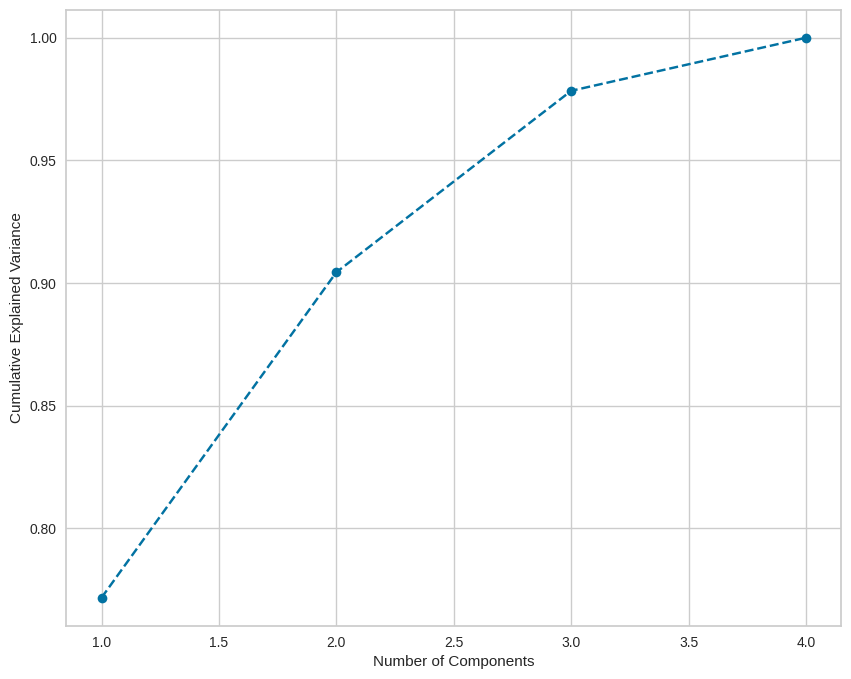

In [ ]:
pca = PCA()
pca.fit(df_pca)
plt.figure(figsize=(10,8))
plt.plot(range(1,5), pca.explained_variance_ratio_.cumsum(), marker='o',linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [ ]:
pca = PCA(n_components = 2)
pca_features = pca.fit_transform(df_pca)

df_feature_sel_last['pca_x'] = pca_features[:,0]
df_feature_sel_last['pca_y'] = pca_features[:,1]

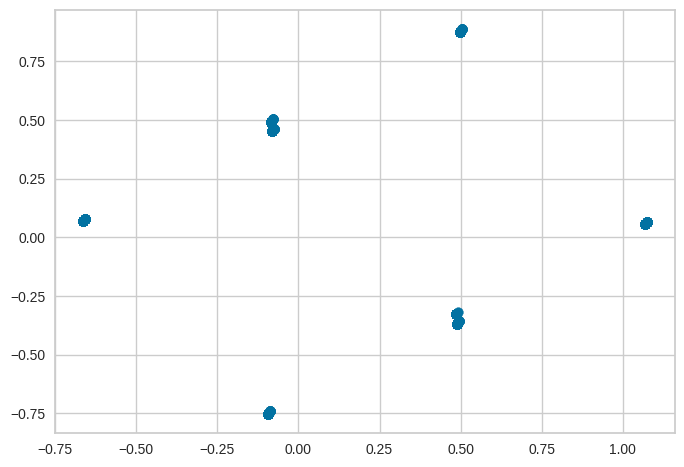

In [ ]:
plt.scatter(df_feature_sel_last['pca_x'], df_feature_sel_last['pca_y'])

##Determine n_cluster for Kmeans


### Elbow Method

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

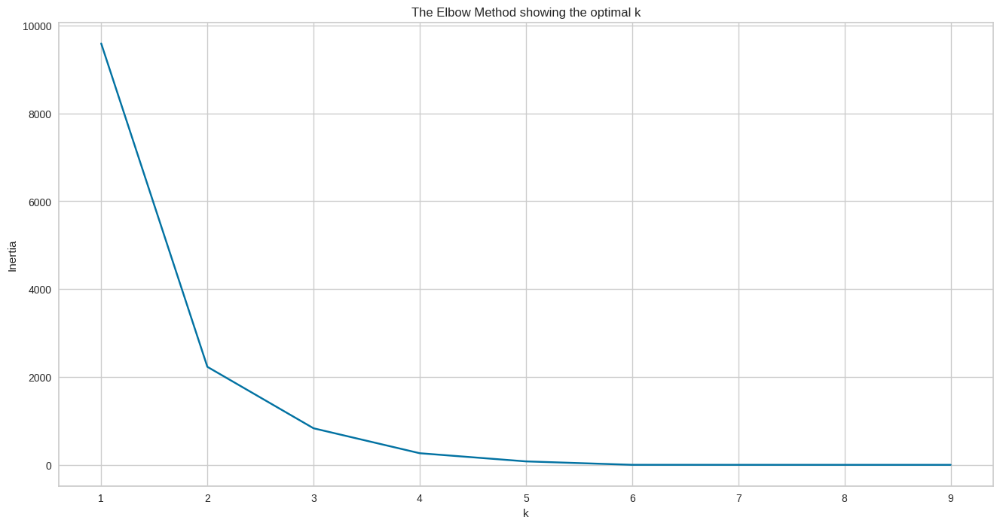

[9591.446371164955, 2231.0618339502585, 832.050193277946, 264.3896584098834, 78.63577375757521, 0.6758303742061518, 0.23090887786157394, 0.03709871829262702, 0.02285365601759022]


In [ ]:
# K-Means Clustering
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k,init='k-means++',random_state=10)
    kmeanModel.fit(pca_features)  #---------------------Ini yang diganti
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()
print(distortions)

### Silhouette Analysis

In [ ]:
# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
def silhoutte_analysis(data,cluster=[2,3,4,5,6,7,8,9]):
    try:
      X = data.to_numpy()
    except:
      X = data

    range_n_clusters = cluster

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=100, init = 'k-means++')
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 2 The average silhouette_score is : 0.7677016685514034


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.8573042057331699


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.9363324056728614


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 5 The average silhouette_score is : 0.9786610418745769


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.9963856297534658


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.9976604483735249


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 8 The average silhouette_score is : 0.9980520356092333


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 9 The average silhouette_score is : 0.9982689578066648


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


For n_clusters = 10 The average silhouette_score is : 0.9984837612976246


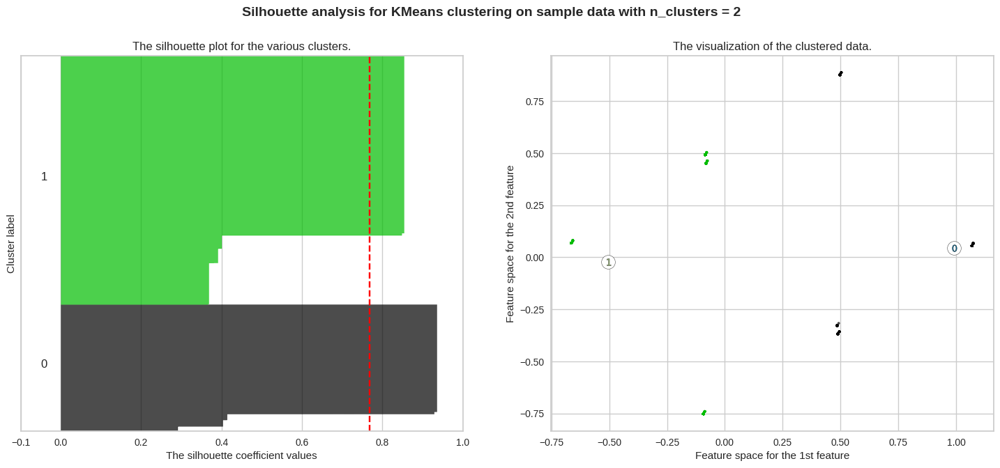

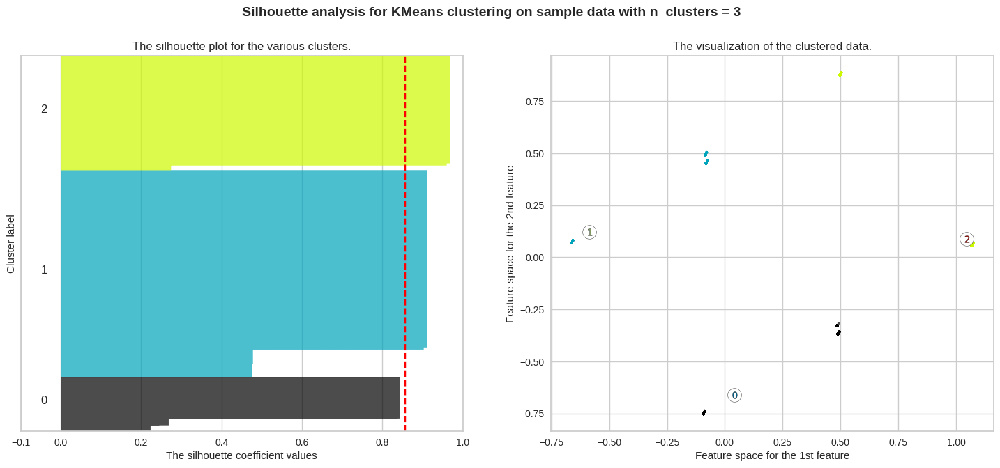

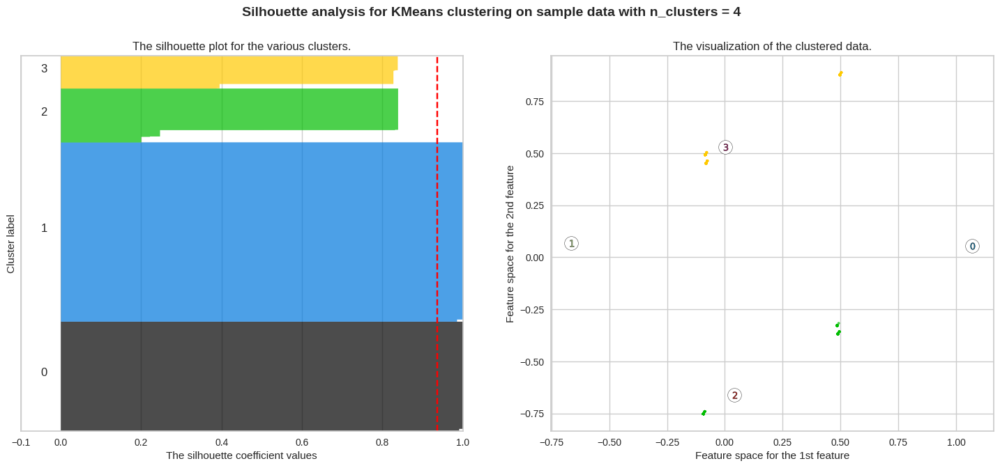

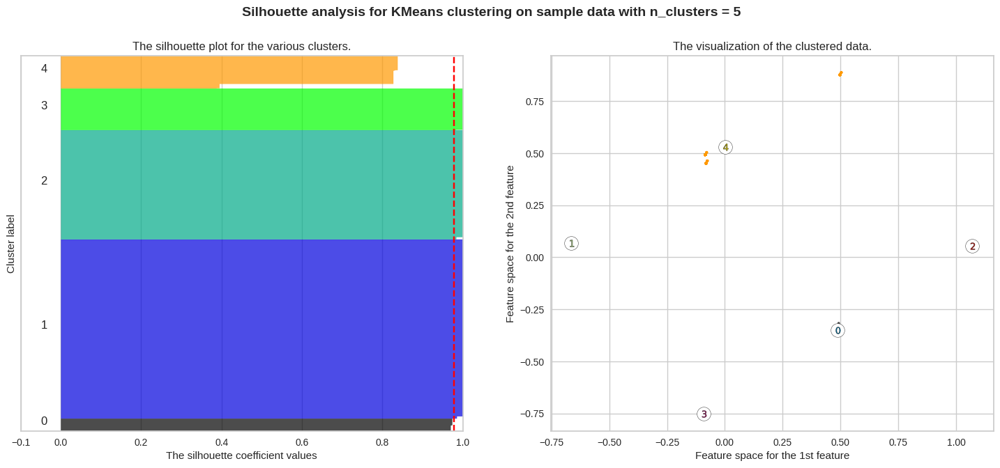

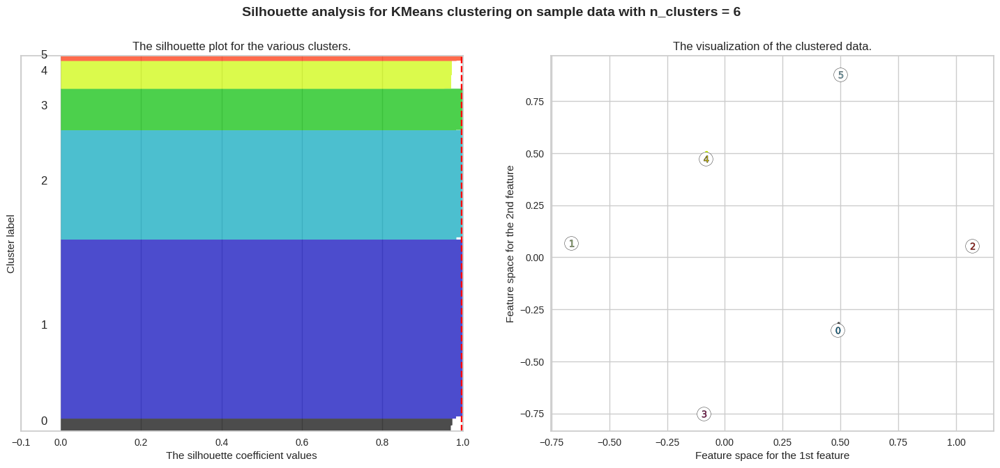

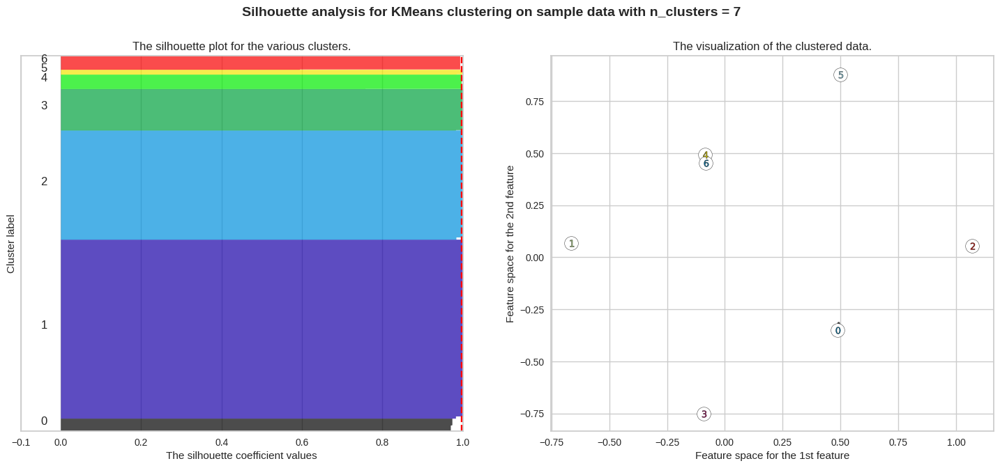

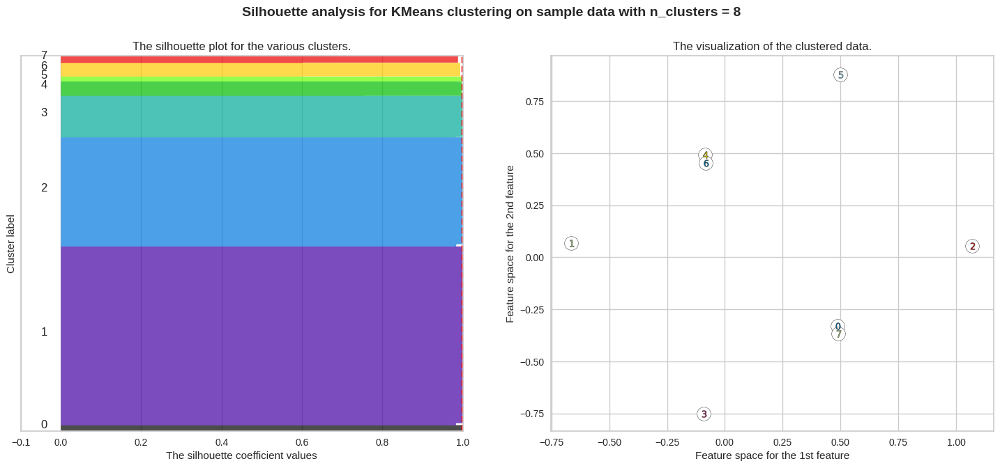

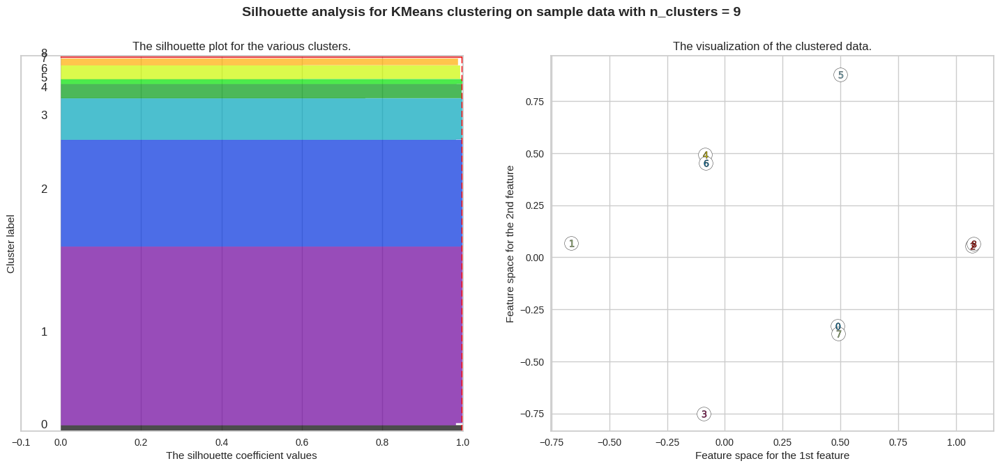

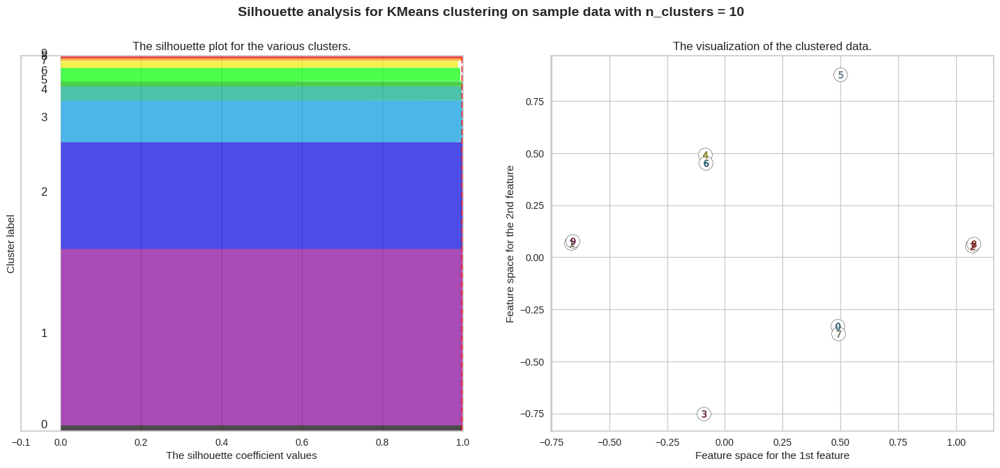

In [ ]:
silhoutte_analysis(pca_features,list(range(2,11)))                   #------Tinggal ganti di variablenya dan rangenya

## Cluster Interpretation

In [ ]:
df_cluster = df_feature_sel_last.copy()
df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14712 entries, 0 to 14711
Data columns (total 39 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   user_id                                   14712 non-null  int64         
 1   registration_import_datetime              14712 non-null  datetime64[ns]
 2   user_gender                               14712 non-null  object        
 3   user_age                                  14712 non-null  int64         
 4   user_occupation                           14712 non-null  object        
 5   user_income_range                         14712 non-null  object        
 6   referral_code_used                        14712 non-null  object        
 7   user_income_source                        14712 non-null  object        
 8   end_of_month_invested_amount              14712 non-null  float64       
 9   total_buy_amount            

In [ ]:
cluster_model = cluster.KMeans(n_clusters=8, random_state=10)
cluster_model.fit(pca_features)
cluster_label = cluster_model.labels_
df_cluster['cluster_kmeans'] = cluster_label
df_cluster.info()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<class 'pandas.core.frame.DataFrame'>
Int64Index: 14712 entries, 0 to 14711
Data columns (total 40 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   user_id                                   14712 non-null  int64         
 1   registration_import_datetime              14712 non-null  datetime64[ns]
 2   user_gender                               14712 non-null  object        
 3   user_age                                  14712 non-null  int64         
 4   user_occupation                           14712 non-null  object        
 5   user_income_range                         14712 non-null  object        
 6   referral_code_used                        14712 non-null  object        
 7   user_income_source                        14712 non-null  object        
 8   end_of_month_invested_amount              14712 non-null  float64       
 9   total_buy_amount            

In [ ]:
mask = (df_cluster['cluster_kmeans']==0) & (df_cluster['cat_campuran'] > 0)
df_cluster['cluster_kmeans'] = df_cluster['cluster_kmeans'].mask(mask, 8)

In [ ]:
binary_cat = ['user_gender', 'referral_code_used']
polytomous_cat = ['user_occupation', 'user_income_range', 'user_income_source']

for i in binary_cat:
  new_col = 'cat_' + str(i)
  df_cluster[new_col] = df_cluster[i].astype('category').cat.codes

for i in polytomous_cat:
  df_dum = pd.get_dummies(data=df_cluster, columns=[i], prefix=[i], drop_first=False)
  df_cluster = df_cluster.merge(df_dum)

In [ ]:
df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14712 entries, 0 to 14711
Data columns (total 67 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   user_id                                     14712 non-null  int64         
 1   registration_import_datetime                14712 non-null  datetime64[ns]
 2   user_gender                                 14712 non-null  object        
 3   user_age                                    14712 non-null  int64         
 4   user_occupation                             14712 non-null  object        
 5   user_income_range                           14712 non-null  object        
 6   referral_code_used                          14712 non-null  object        
 7   user_income_source                          14712 non-null  object        
 8   end_of_month_invested_amount                14712 non-null  float64       
 9   total_

### PCA plot

<Axes: xlabel='pca_x', ylabel='pca_y'>

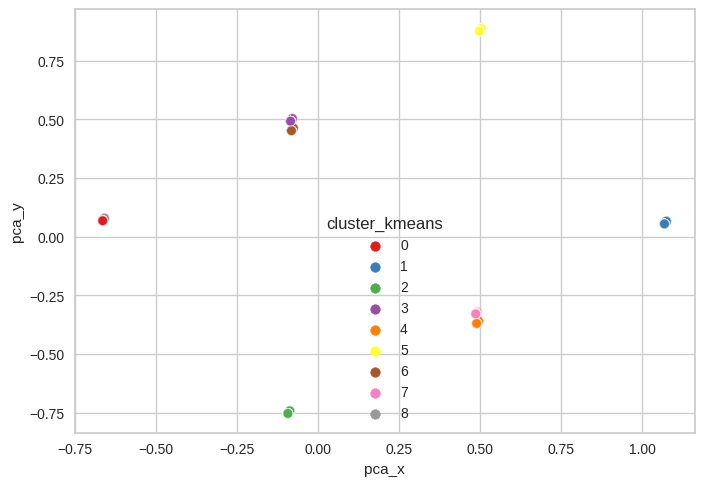

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="cluster_kmeans", data=df_cluster, alpha=0.3, palette='Set1')

<Axes: xlabel='pca_x', ylabel='pca_y'>

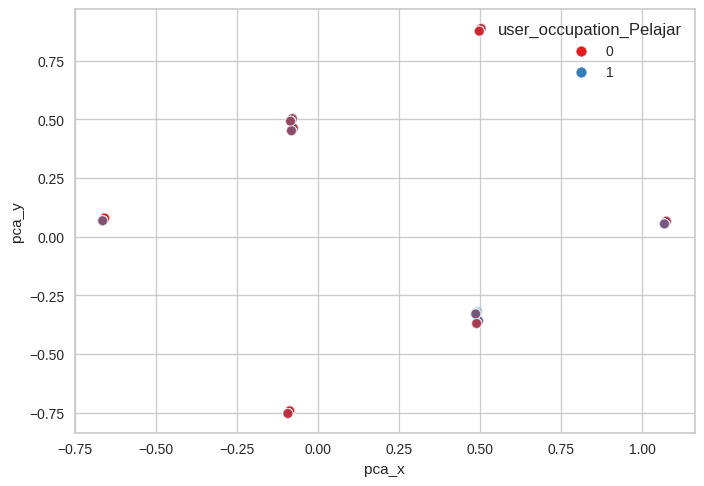

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="user_occupation_Pelajar", data=df_cluster, alpha=0.3, palette='Set1')

<Axes: xlabel='pca_x', ylabel='pca_y'>

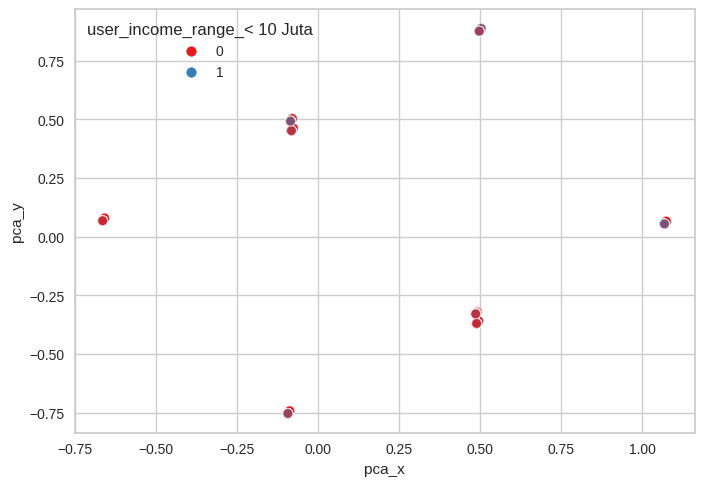

In [ ]:
sns.scatterplot(x="pca_x", y="pca_y", hue="user_income_range_< 10 Juta", data=df_cluster, alpha=0.3, palette='Set1')

In [ ]:
df_temp = df_cluster.copy()

pt= PowerTransformer()

col = ['total_transaction_value', 'pasar_uang_invested_amount', 'saham_invested_amount', 'campuran_invested_amount', 'pendapatan_tetap_invested_amount']
df_temp[col] = pt.fit_transform(df_temp[col])

<ipython-input-122-73391132851a>:1: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df_temp, x='total_transaction_value', hue='cluster_kmeans', palette='pastel')


<Axes: xlabel='total_transaction_value', ylabel='Density'>

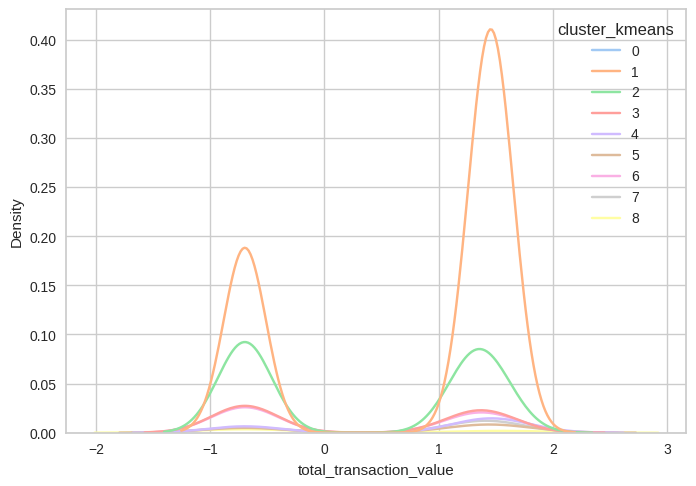

In [ ]:
sns.kdeplot(data=df_temp, x='total_transaction_value', hue='cluster_kmeans', palette='pastel')

<ipython-input-123-5d4667311841>:11: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


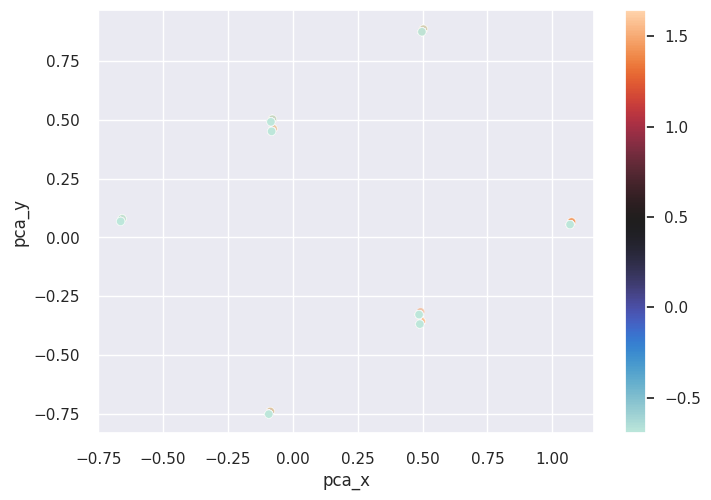

In [ ]:
sns.set()
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="total_transaction_value",
                     palette='icefire', alpha=0.5, data=df_temp)

norm = plt.Normalize(df_temp['total_transaction_value'].min(), df_temp['total_transaction_value'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

<ipython-input-124-c681c77354ad>:11: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


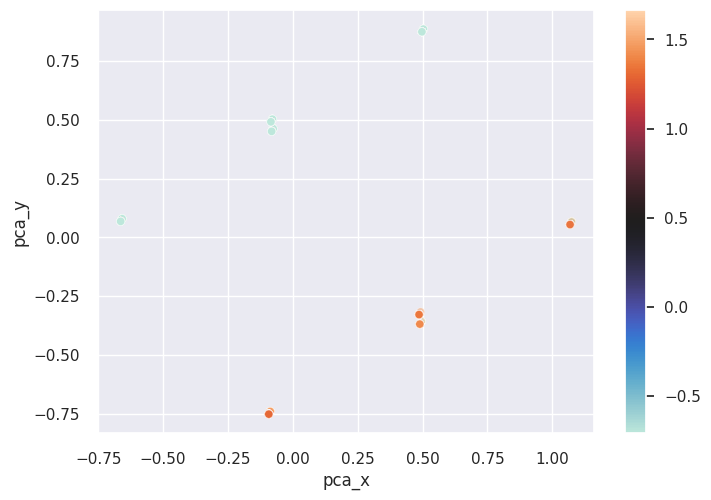

In [ ]:
sns.set()
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="pasar_uang_invested_amount",
                     palette='icefire', alpha=0.5, data=df_temp)

norm = plt.Normalize(df_temp['pasar_uang_invested_amount'].min(), df_temp['pasar_uang_invested_amount'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

<ipython-input-125-05faef2c4fd0>:11: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


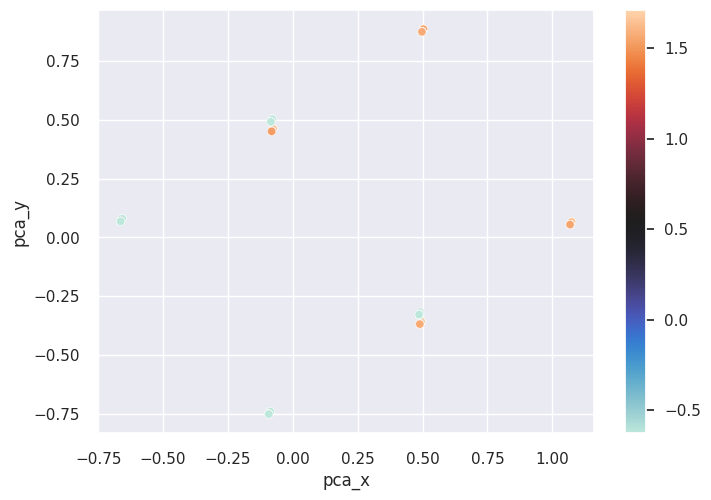

In [ ]:
sns.set()
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="pendapatan_tetap_invested_amount",
                     palette='icefire', alpha=0.5, data=df_temp)

norm = plt.Normalize(df_temp['pendapatan_tetap_invested_amount'].min(), df_temp['pendapatan_tetap_invested_amount'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

<ipython-input-126-b280fa201a43>:11: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


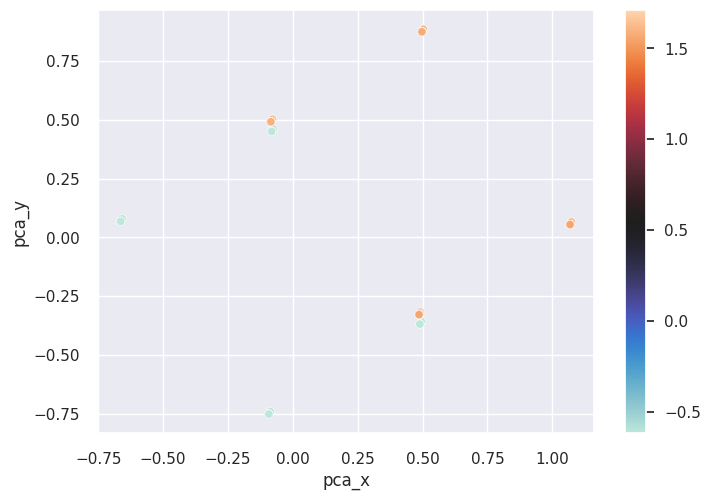

In [ ]:
sns.set()
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="saham_invested_amount",
                     palette='icefire', alpha=0.5, data=df_temp)

norm = plt.Normalize(df_temp['saham_invested_amount'].min(), df_temp['saham_invested_amount'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

<ipython-input-127-b19f6dd1b4e6>:11: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


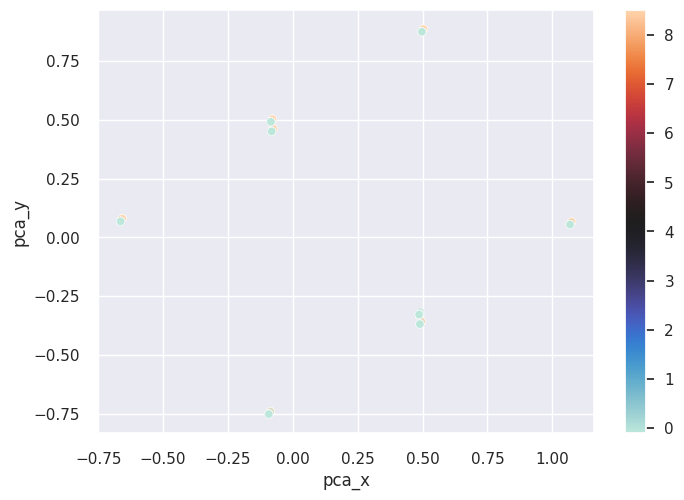

In [ ]:
sns.set()
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="campuran_invested_amount",
                     palette='icefire', alpha=0.5, data=df_temp)

norm = plt.Normalize(df_temp['campuran_invested_amount'].min(), df_temp['campuran_invested_amount'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

<ipython-input-128-0769fe344b2d>:11: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  ax.figure.colorbar(sm)


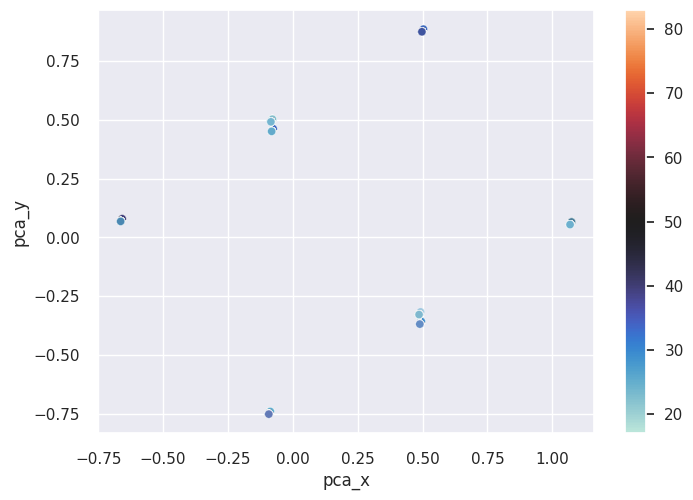

In [ ]:
sns.set()
ax = sns.scatterplot(x="pca_x", y="pca_y", hue="user_age",
                     palette='icefire', alpha=0.5, data=df_temp)

norm = plt.Normalize(df_temp['user_age'].min(), df_temp['user_age'].max())
sm = plt.cm.ScalarMappable(cmap="icefire", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)

plt.show()

### Count plot

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

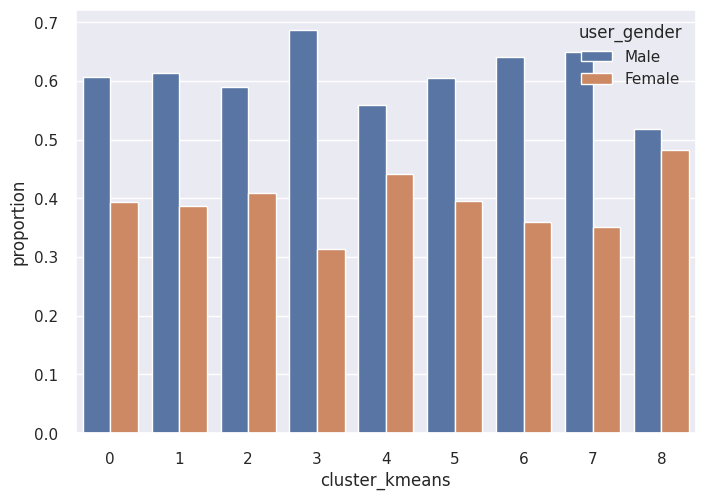

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_gender'].value_counts(normalize=True)
sns.barplot(data=df_temp, x='cluster_kmeans', y='proportion', hue='user_gender')

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

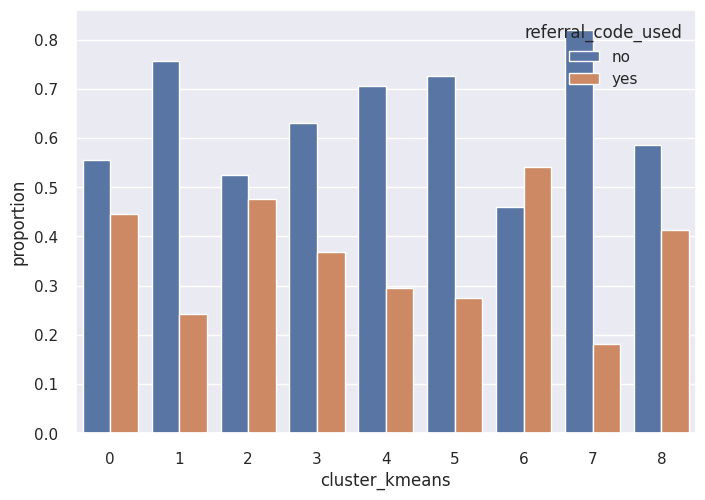

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['referral_code_used'].value_counts(normalize=True)
sns.barplot(data=df_temp, x='cluster_kmeans', y='proportion', hue='referral_code_used')

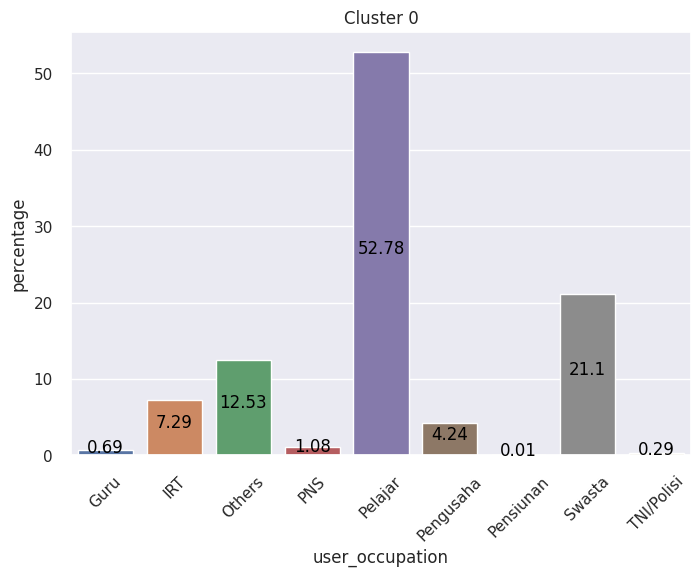

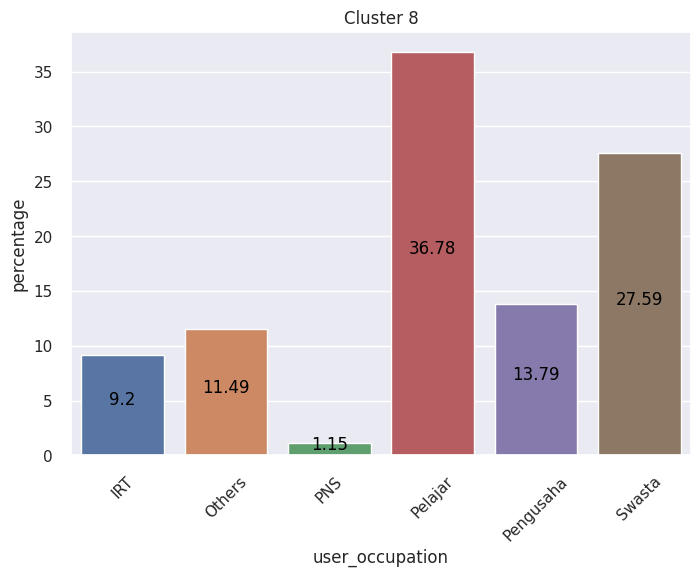

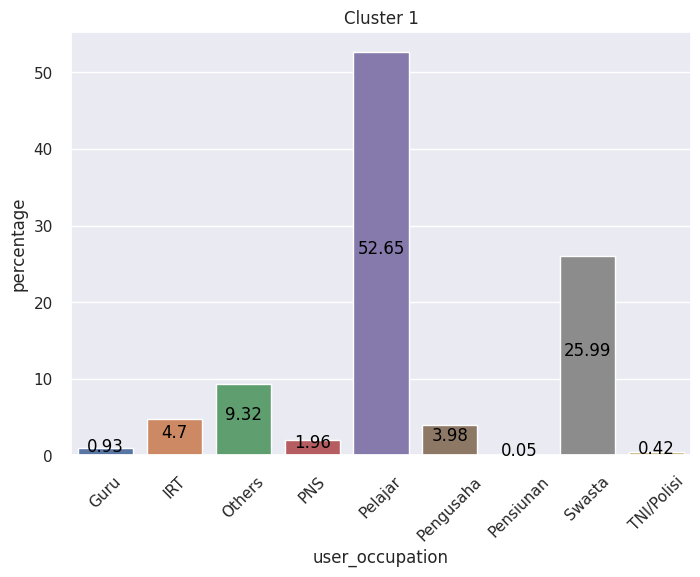

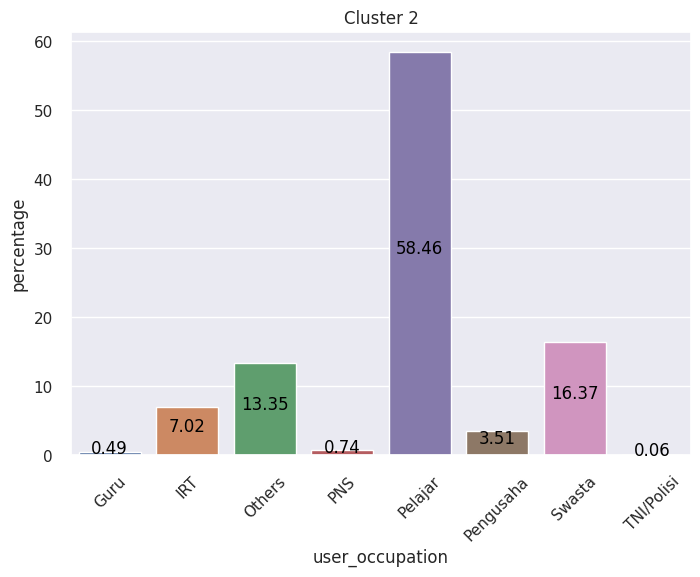

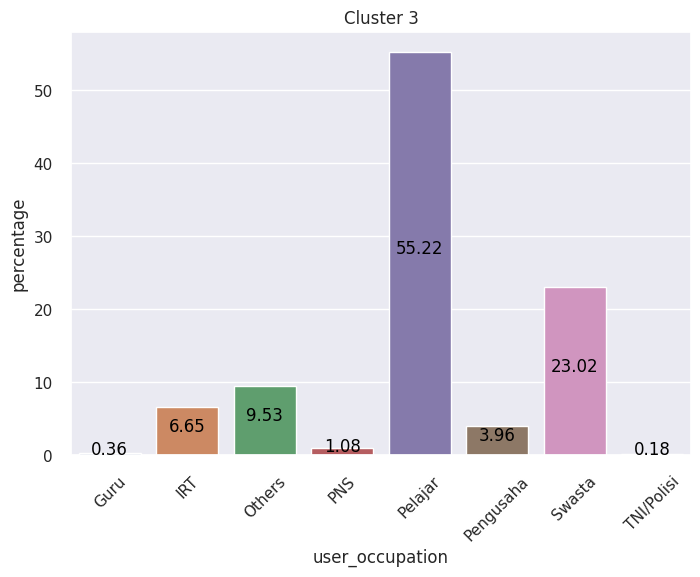

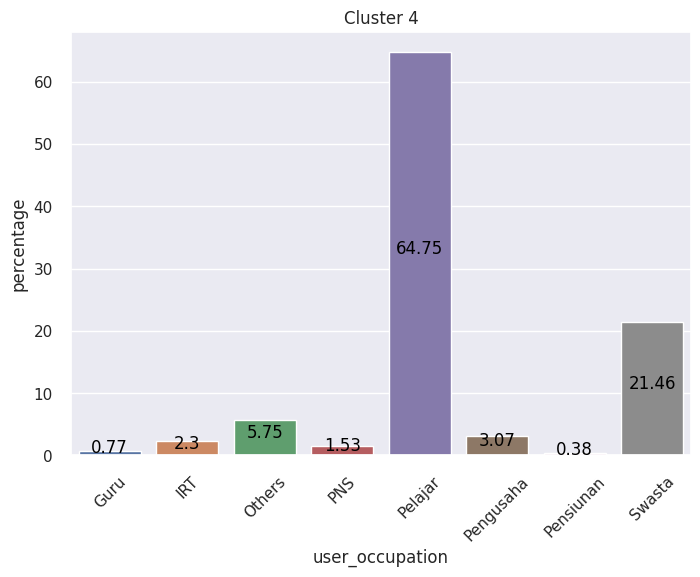

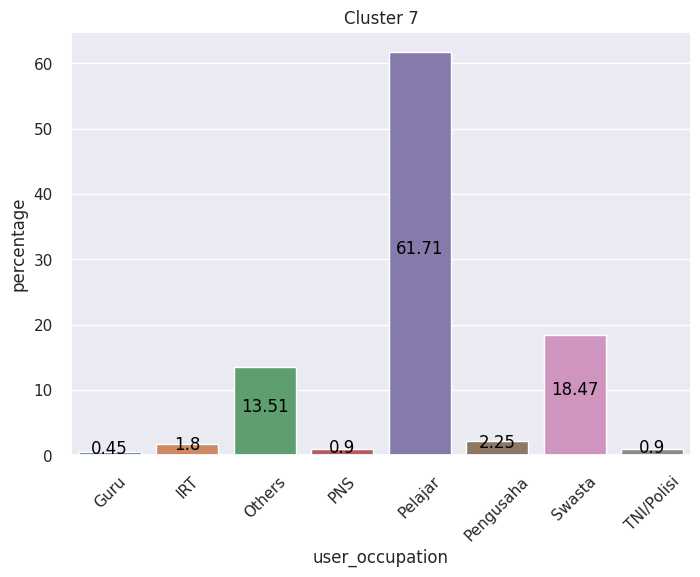

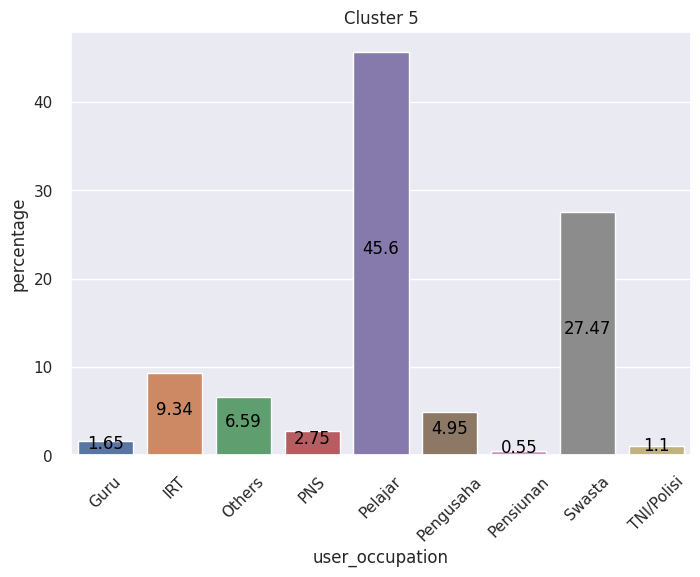

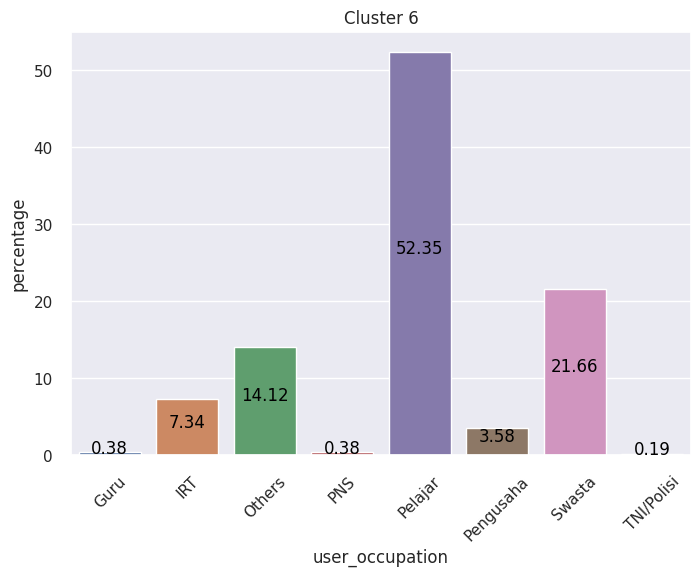

In [ ]:
df_temp = df_cluster.groupby('user_occupation', as_index=False)['cluster_kmeans'].value_counts()

for n,i in enumerate(df_cluster['cluster_kmeans'].unique(),start=1):

  df_plot = df_temp[df_temp['cluster_kmeans']==i].copy().reset_index()
  df_plot['percentage'] = df_plot['count']/df_plot['count'].sum()*100
  chart = sns.barplot(x='user_occupation', y='percentage', data=df_plot)
  chart.set(title='Cluster '+str(i))
  chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
  for text in range(len(df_plot)):
    chart.text(text, df_plot['percentage'][text]/2, str(round(df_plot['percentage'][text],2)),\
               horizontalalignment='center', fontdict=dict(color='black', fontsize=12))
  plt.show()

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

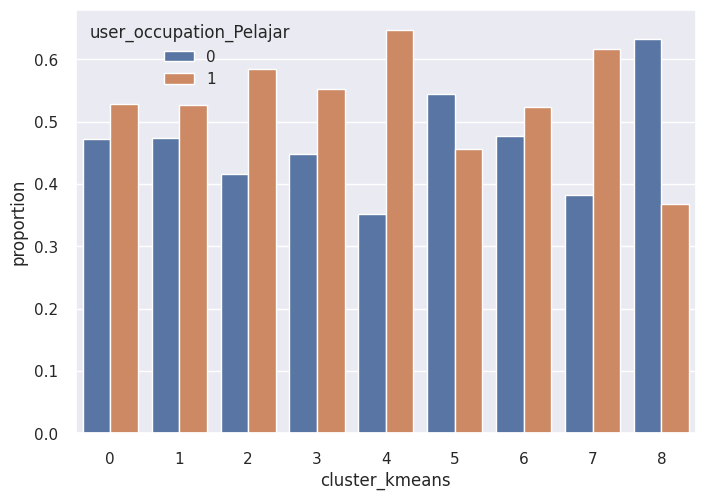

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_occupation_Pelajar'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_occupation_Pelajar', y='proportion', data=df_temp)

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

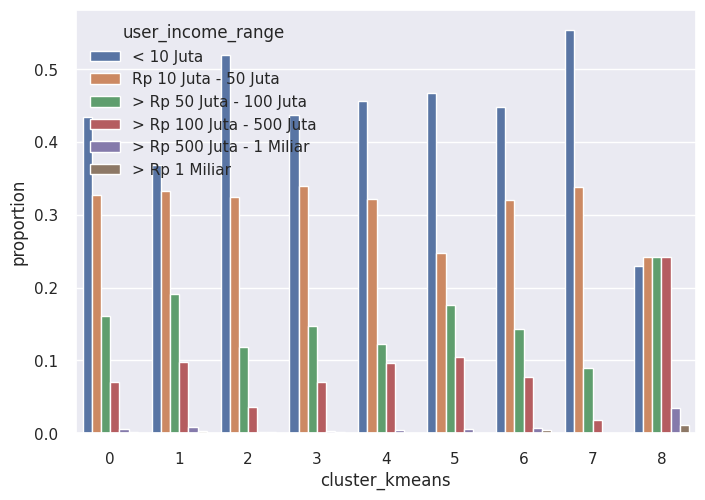

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_income_range'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_income_range', y='proportion', data=df_temp)

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

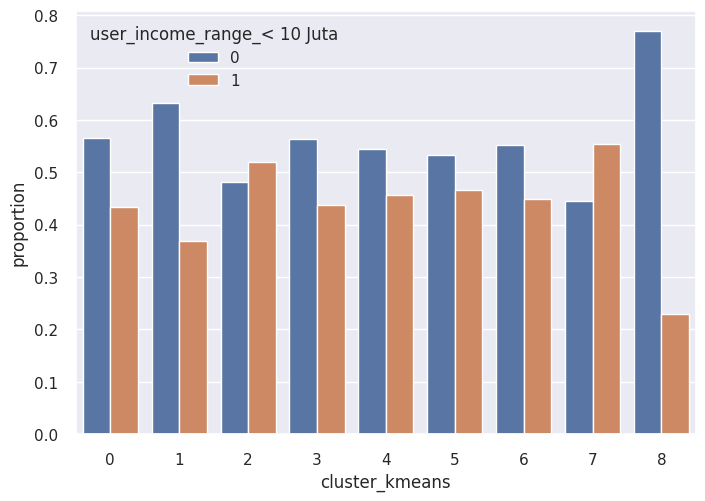

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_income_range_< 10 Juta'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_income_range_< 10 Juta', y='proportion', data=df_temp)

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

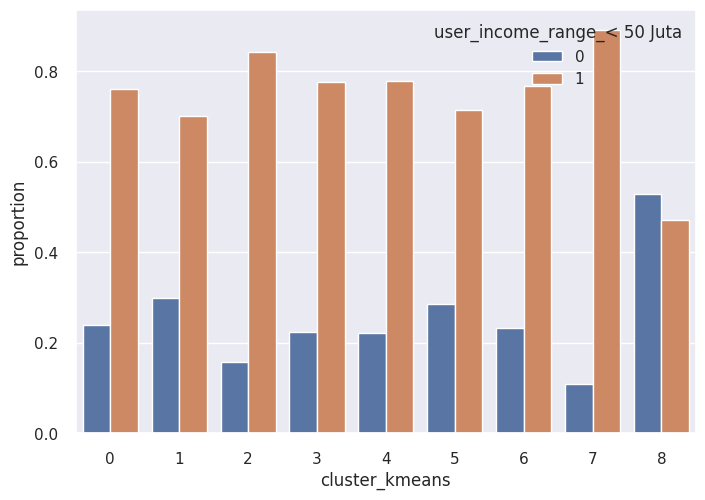

In [ ]:
df_cluster['user_income_range_< 50 Juta'] = df_cluster['user_income_range_< 10 Juta'] + df_cluster['user_income_range_Rp 10 Juta - 50 Juta']
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_income_range_< 50 Juta'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_income_range_< 50 Juta', y='proportion', data=df_temp)

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

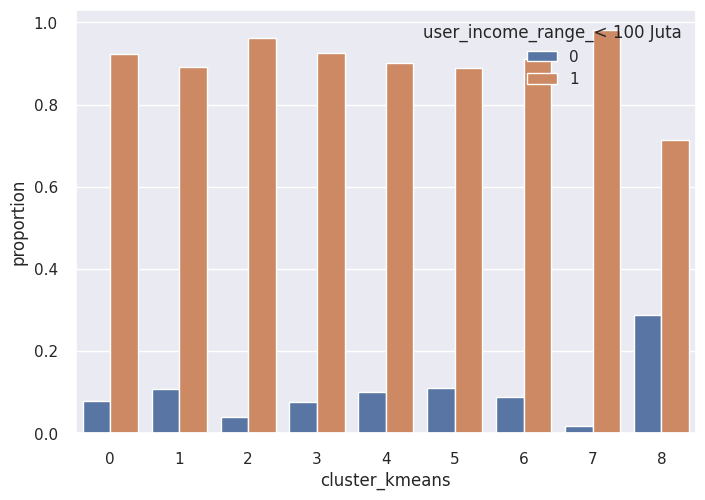

In [ ]:
df_cluster['user_income_range_< 100 Juta'] = df_cluster['user_income_range_< 50 Juta'] + df_cluster['user_income_range_> Rp 50 Juta - 100 Juta']
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_income_range_< 100 Juta'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_income_range_< 100 Juta', y='proportion', data=df_temp)

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

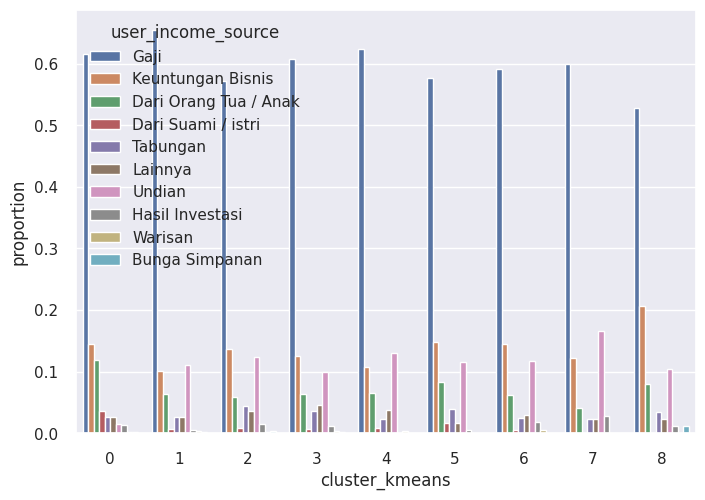

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_income_source'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_income_source', y='proportion', data=df_temp)

<Axes: xlabel='cluster_kmeans', ylabel='proportion'>

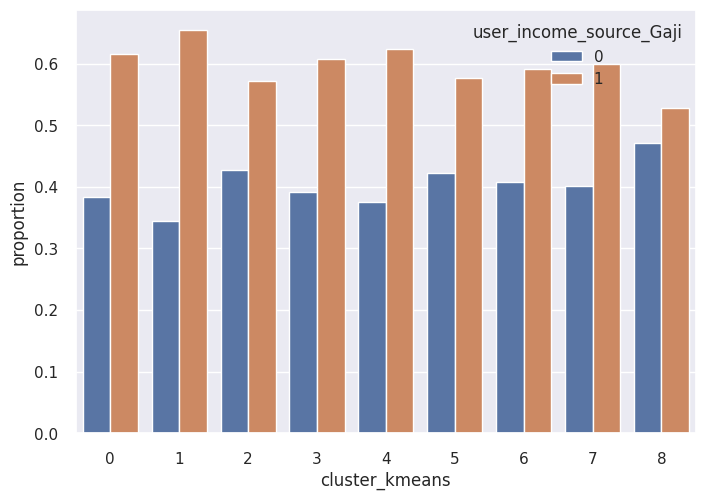

In [ ]:
df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)['user_income_source_Gaji'].value_counts(normalize=True)
sns.barplot(x='cluster_kmeans', hue='user_income_source_Gaji', y='proportion', data=df_temp)

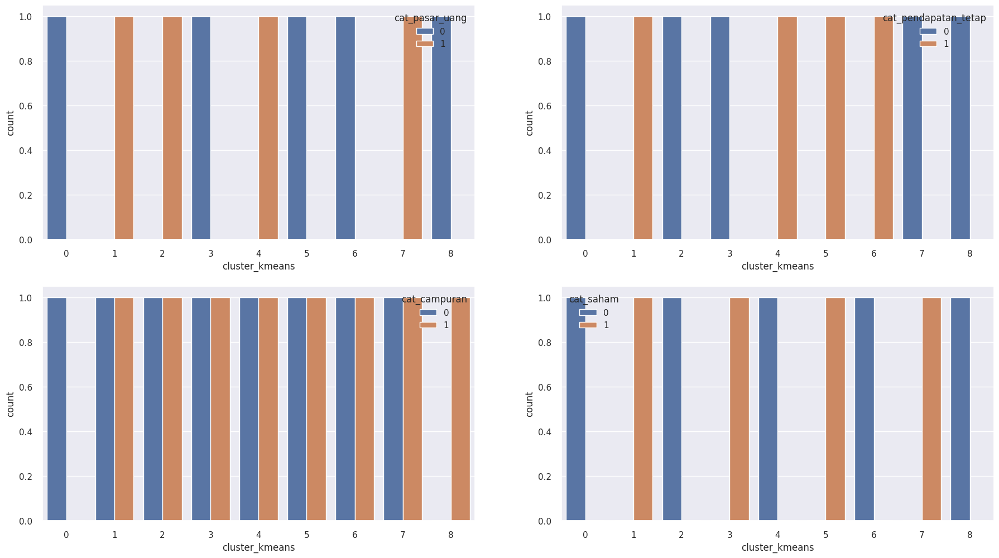

In [ ]:
fig = plt.figure(figsize=(22,12))

for i, label in enumerate(df_cluster.columns[33:37], start=1):
  ax = fig.add_subplot(2,2,i)
  df_temp = df_cluster.groupby('cluster_kmeans', as_index=False)[label].value_counts(normalize=True)
  sns.countplot(x='cluster_kmeans', hue=label, data=df_temp)

In [ ]:
col = ['user_id']
df_cluster.groupby('cluster_kmeans',as_index = False)[col].agg(['count'])

,user_id
,count
cluster_kmeans,
0,6954
1,4294
2,1625
3,556
4,261
5,182
6,531
7,222


In [ ]:
col = ['cat_pendapatan_tetap','cat_pasar_uang','cat_saham','cat_campuran']
df_cluster.groupby('cluster_kmeans',as_index = False)[col].agg(['sum'])

,cat_pendapatan_tetap,cat_pasar_uang,cat_saham,cat_campuran
,sum,sum,sum,sum
cluster_kmeans,,,,
0,0,0,0,0
1,4294,4294,4294,90
2,0,1625,0,15
3,0,0,556,7
4,261,261,0,11
5,182,0,182,10
6,531,0,0,13
7,0,222,222,1


In [ ]:
col = ['total_buy_amount', 'total_sell_amount', 'total_transaction_value', 'end_of_month_invested_amount']
df_cluster.groupby('cluster_kmeans',as_index = False)[col].agg(['mean','median', 'max'])

total_buy_amount                       total_sell_amount  \
                           mean   median          max              mean   
cluster_kmeans                                                            
0                          0.00     0.00         0.00              0.00   
1                    1441804.34 30000.00 326000000.00         328237.43   
2                     706589.16     0.00 433800000.00         136624.31   
3                      92256.86     0.00  10010000.00         107992.35   
4                    6705851.42 45000.00 452950000.00        1468279.52   
5                    1840834.39     0.00 207000000.00         230790.49   
6                    4893724.95     0.00 799500000.00         332156.39   
7                     319258.27     0.00  10000287.00         118707.76   
8                    2911000.00     0.00  50000000.00        1218390.80   

                                   total_transaction_value            \
               median          max                    mean    median   
cluster_kmeans                                                         
0                0.00         0.00                    0.00      0.00   
1                0.00 185000000.00              1770041.77 100000.00   
2                0.00  32500000.00               843213.47  10000.00   
3                0.00  10000000.00               200249.21      0.00   
4                0.00 112500000.00              8174130.94 100000.00   
5                0.00  20000000.00              2071624.88 100000.00   
6                0.00  80000000.00              5225881.33      0.00   
7                0.00   4300000.00               437966.03  45000.00   
8                0.00  50000000.00              4129390.80      0.00   

                            end_of_month_invested_amount             \
                        max                         mean     median   
cluster_kmeans                                                        
0                      0.00                         0.00       0.00   
1              428075955.00                   2140047.71  200000.00   
2              433800000.00                   1509852.81   10000.00   
3               10010000.00                    301591.80   10000.00   
4              452950000.00                  12250592.66  400000.00   
5              207000000.00                   4484167.11  117500.00   
6              799999249.00                   7905785.47   20000.00   
7               10000287.00                   1088472.12  100000.00   
8               50000000.00                  11606894.15 2000000.00   

                              
                         max  
cluster_kmeans                
0                       0.00  
1               478075955.00  
2              1012200000.00  
3                30000000.00  
4               900000000.00  
5               463000000.00  
6               970000000.00  
7                80000000.00  
8               300000000.00

In [ ]:
col = ['pendapatan_tetap_invested_amount','pasar_uang_invested_amount','saham_invested_amount','campuran_invested_amount']
df_cluster.groupby('cluster_kmeans',as_index = False)[col].agg(['mean','min', 'max'])

pendapatan_tetap_invested_amount                    \
                                           mean  min          max   
cluster_kmeans                                                      
0                                          0.00 0.00         0.00   
1                                     962448.19 0.00 305740000.00   
2                                          0.00 0.00         0.00   
3                                          0.00 0.00         0.00   
4                                    6329538.67 0.00 450000000.00   
5                                    3502917.27 0.00 450000000.00   
6                                    7558469.28 0.00 970000000.00   
7                                          0.00 0.00         0.00   
8                                          0.00 0.00         0.00   

               pasar_uang_invested_amount                     \
                                     mean  min           max   
cluster_kmeans                                                 
0                                    0.00 0.00          0.00   
1                               569077.88 0.00  240075955.00   
2                              1481498.96 0.00 1012200000.00   
3                                    0.00 0.00          0.00   
4                              5762255.13 0.00  450000000.00   
5                                    0.00 0.00          0.00   
6                                    0.00 0.00          0.00   
7                               580047.86 0.00   30000000.00   
8                                    0.00 0.00          0.00   

               saham_invested_amount                   \
                                mean  min         max   
cluster_kmeans                                          
0                               0.00 0.00        0.00   
1                          556149.46 0.00 61840000.00   
2                               0.00 0.00        0.00   
3                          290350.79 0.00 30000000.00   
4                               0.00 0.00        0.00   
5                          672348.74 0.00 25000000.00   
6                               0.00 0.00        0.00   
7                          508424.27 0.00 50000000.00   
8                               0.00 0.00        0.00   

               campuran_invested_amount                    
                                   mean  min          max  
cluster_kmeans                                             
0                                  0.00 0.00         0.00  
1                              52372.18 0.00  25000000.00  
2                              28353.85 0.00  40000000.00  
3                              11241.01 0.00   3500000.00  
4                             158798.85 0.00  20000000.00  
5                             308901.10 0.00  21000000.00  
6                             347316.20 0.00  54000000.00  
7                                  0.00 0.00         0.00  
8                           11606894.15 0.00 300000000.00

In [ ]:
col = ['buy_freq', 'sell_freq']
df_cluster.groupby('cluster_kmeans',as_index = False)[col].agg(['mean','min', 'max'])

buy_freq            sell_freq           
                   mean  min   max      mean  min   max
cluster_kmeans                                         
0                  0.00 0.00  0.00      0.00 0.00  0.00
1                  1.37 0.00 24.00      0.49 0.00 11.00
2                  0.45 0.00 13.00      0.34 0.00  5.00
3                  0.28 0.00  5.00      0.35 0.00  3.00
4                  1.31 0.00  8.00      0.43 0.00  6.00
5                  0.86 0.00 10.00      0.46 0.00  3.00
6                  0.45 0.00 12.00      0.29 0.00  2.00
7                  1.14 0.00 12.00      0.57 0.00  3.00
8                  0.37 0.00  5.00      0.15 0.00  2.00

## Conclusion

***Cluster 0: No Investment/0***

6954 user

average total buy in this period: Rp 0

buy frequency: 0

average total sell in this period: Rp 0

sell frequency: 0

average total investment: Rp 0

pelajar is slightly more than not pelajar, mostly have income <50 juta, source of income is Gaji

They haven't invested in any product

***Cluster 1: The Most Invested/TUS***

4294 user

average total buy in this period: Rp 1,441,804.34

buy frequency: 1.37

average total sell in this period: Rp 328,237.43

sell frequency: 0.49

average total investment: Rp 2,140,047.71

pelajar is slightly more than not pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap, pasar_uang and saham, few of them also invest in campuran



***Cluster 2: Money Market Investor/U***

1625 user

average total buy in this period: Rp 706,589.16

buy frequency: 0.45

average total sell in this period: Rp 136,624.31

sell frequency: 0.34

average total investment: Rp 1,509,852.81

mostly are pelajar, user with income <10 juta is slightly more than user with income >10juta, source of income is Gaji

all of them invest in pasar_uang, few of them also invest in campuran



***Cluster 3: The Equity Investor/S***

556 user

average total buy in this period: Rp 92,256.86

buy frequency: 0.28

average total sell in this period: Rp 107,992.35

sell frequency: 0.35

average total investment: Rp 301,591.80

mostly are pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in saham, few of them also invest in campuran

***Cluster 4: The Fixed Income and Money Market Investor/TU***

261 user

average total buy in this period: Rp 6,705,851.42

buy frequency: 1.31

average total sell in this period: Rp 1,468,279.52

sell frequency: 0.43

average total investment: Rp 12,250,592.66

mostly are pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap and pasar_uang, few of them also invest in campuran

***Cluster 5: The Fixed Income and Equity Investor/TS***

182 user

average total buy in this period: Rp 1,840,834.39

buy frequency: 0.86

average total sell in this period: Rp 230,790.49

sell frequency: 0.46

average total investment: Rp 4,484,167.11

mostly are not pelajar, their occupation are either Swasta, IRT, Pengusaha or Others, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap and saham, few of them also invest in campuran

***Cluster 6: The Fixed Income Investor/T***

531 user

average total buy in this period: Rp 4,893,724.95

buy frequency: 0.45

average total sell in this period: Rp 332,156.39

sell frequency: 0.29

average total investment: Rp 7,905,785.47

Pelajar is slightly more than not pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap, few of them also invest in campuran

***Cluster 7: The Money Market and Equity Investor/US***

222 user

average total buy in this period: Rp 319,258.27

buy frequency: 1.14

average total sell in this period: Rp 118,707.76

sell frequency: 0.57

average total investment: Rp 1,088,472.12

Mostly are Pelajar, mostly have income <10 juta, source of income is Gaji

all of them invest in pendapatan_tetap and saham, few of them also invest in campuran

***Cluster 8: The Discretionary Fund Investor/C***

87 user

average total buy in this period: Rp 2,911,000.00

buy frequency: 0.37

average total sell in this period: Rp 1,218,390.80

sell frequency: 0.15

average total investment: Rp 11,606,894.15

Mostly are not Pelajar, mostly have occupation either Swasta, Pengusaha or Others, mostly have income <100 juta, source of income is Gaji

all of them invest only in Campuran

#ADVANCED ASSIGNMENT

#1. Business Problem

Marketing team has only a budget for campaign 30% of total users on each segment. They want me to choose who will be targeted with the budget limitation and the projection of how profitable the campaign. Since we want to convert people who churn, I will focus on finding customer with high probability to churn. Cost per campaign is Rp 1000 and the transaction fee is 0.15%.

#2. Preparation

##Libraries

In [ ]:
from sklearn import cluster
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, recall_score, precision_score, f1_score
from sklearn.preprocessing import FunctionTransformer
from sklearn.feature_selection import RFE, RFECV
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

%pip install mlxtend --upgrade
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

%pip install optuna
import optuna

from scipy.stats import yeojohnson
import math

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 28.1 MB/s eta 0:00:00
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.14.0
    Uninstalling mlxtend-0.14.0:
      Successfully uninstalled mlxtend-0.14.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.7/365.7 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.9/212.9 kB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 11.5 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings("ignore")

## Import Additional Data

In [ ]:
sheet_url = 'https://docs.google.com/spreadsheets/d/1WxGrECbxJzD3cJmkuZ7sorxGQJwWCTIP1N04_Z7UaCw/edit#gid=0'
sheet_url_trf = sheet_url.replace('/edit#gid=', '/export?format=csv&gid=')
df_churn = pd.read_csv(sheet_url_trf)
df_churn

,user_id,churn
0,50701,1
1,50961,1
2,51883,0
3,53759,0
4,54759,1
...,...,...
8479,4173878,0
8480,4174045,0
8481,4174169,0
8482,4174486,0


In [ ]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8484 entries, 0 to 8483
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   user_id  8484 non-null   int64
 1   churn    8484 non-null   int64
dtypes: int64(2)
memory usage: 132.7 KB


# 3. Data Cleaning

##Handling Missing Values

In [ ]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8484 entries, 0 to 8483
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   user_id  8484 non-null   int64
 1   churn    8484 non-null   int64
dtypes: int64(2)
memory usage: 132.7 KB


No missing values

##Handling Duplicates

In [ ]:
df_churn.duplicated().value_counts()

False    8484
dtype: int64

No Duplicates

##Check Data Type

In [ ]:
df_churn.head()

,user_id,churn
0,50701,1
1,50961,1
2,51883,0
3,53759,0
4,54759,1


Data are in correct type

## Data Merge

In [ ]:
df_churnanalysis = df_churn.merge(df_cluster, how='inner', on='user_id')
df_churnanalysis.head()

,user_id,churn,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,end_of_month_invested_amount,...,user_income_source_Dari Suami / istri,user_income_source_Gaji,user_income_source_Hasil Investasi,user_income_source_Keuntungan Bisnis,user_income_source_Lainnya,user_income_source_Tabungan,user_income_source_Undian,user_income_source_Warisan,user_income_range_< 50 Juta,user_income_range_< 100 Juta
0,50701,1,2021-08-24,Female,28,IRT,Rp 10 Juta - 50 Juta,no,Gaji,10000000.00,...,0,1,0,0,0,0,0,0,1,1
1,50961,1,2021-08-20,Female,33,Swasta,> Rp 100 Juta - 500 Juta,no,Gaji,4100000.00,...,0,1,0,0,0,0,0,0,0,0
2,51883,0,2021-09-29,Male,27,Pelajar,> Rp 50 Juta - 100 Juta,no,Gaji,0.00,...,0,1,0,0,0,0,0,0,0,1
3,53759,0,2021-08-19,Male,29,Swasta,< 10 Juta,no,Gaji,100000.00,...,0,1,0,0,0,0,0,0,1,1
4,54759,1,2021-08-11,Male,27,Swasta,> Rp 100 Juta - 500 Juta,no,Gaji,12000000.00,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
df_churnanalysis.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8484 entries, 0 to 8483
Data columns (total 70 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   user_id                                     8484 non-null   int64         
 1   churn                                       8484 non-null   int64         
 2   registration_import_datetime                8484 non-null   datetime64[ns]
 3   user_gender                                 8484 non-null   object        
 4   user_age                                    8484 non-null   int64         
 5   user_occupation                             8484 non-null   object        
 6   user_income_range                           8484 non-null   object        
 7   referral_code_used                          8484 non-null   object        
 8   user_income_source                          8484 non-null   object        
 9   end_of_m

#4. EDA

## Checking Balance

In [ ]:
df_churneda = df_churnanalysis.copy()
df_churneda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8484 entries, 0 to 8483
Data columns (total 70 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   user_id                                     8484 non-null   int64         
 1   churn                                       8484 non-null   int64         
 2   registration_import_datetime                8484 non-null   datetime64[ns]
 3   user_gender                                 8484 non-null   object        
 4   user_age                                    8484 non-null   int64         
 5   user_occupation                             8484 non-null   object        
 6   user_income_range                           8484 non-null   object        
 7   referral_code_used                          8484 non-null   object        
 8   user_income_source                          8484 non-null   object        
 9   end_of_m

In [ ]:
df_churneda['churn'].value_counts(normalize=True)*100

0   59.11
1   40.89
Name: churn, dtype: float64

In [ ]:
data = df_churneda['churn'].value_counts(normalize=True).to_frame()

,churn
0,0.59
1,0.41


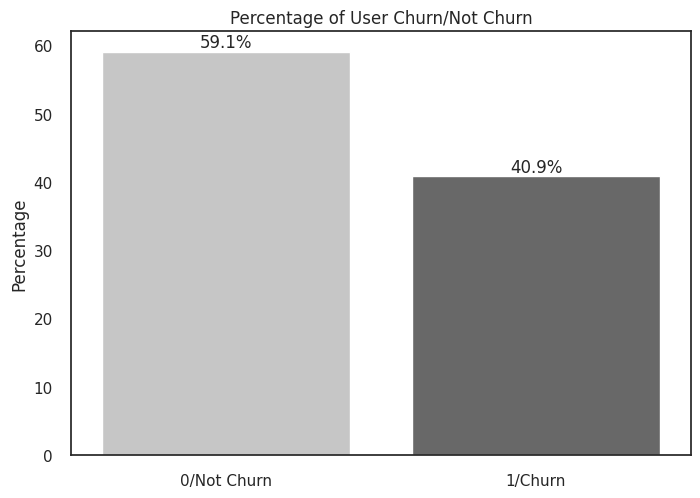

In [ ]:
data = (df_churneda['churn'].value_counts(normalize=True)*100).to_frame()

sns.set_theme(style='white', palette=None)
sns.barplot(x=['0/Not Churn', '1/Churn'],
            y='churn',
            palette='Greys',
            data = data).bar_label(chart.containers[0], fmt='%.1f%%')

plt.title('Percentage of User Churn/Not Churn')
plt.ylabel('Percentage')

plt.savefig('plot9.png', dpi=200, bbox_inches='tight', transparent=True)
plt.show()

59% didn't churn

In [ ]:
df_clusterchurn = (df_churneda.groupby('cluster_kmeans')['churn'].value_counts(normalize=True)*100).reset_index(0).rename(columns={'churn':'proportion'}).reset_index().sort_values(by=['cluster_kmeans', 'churn'])
df_clusterchurn

,churn,cluster_kmeans,proportion
0,0,0,99.86
1,1,0,0.14
2,0,1,50.30
3,1,1,49.70
4,0,2,63.69
5,1,2,36.31
6,0,3,73.02
7,1,3,26.98
9,0,4,41.76
8,1,4,58.24


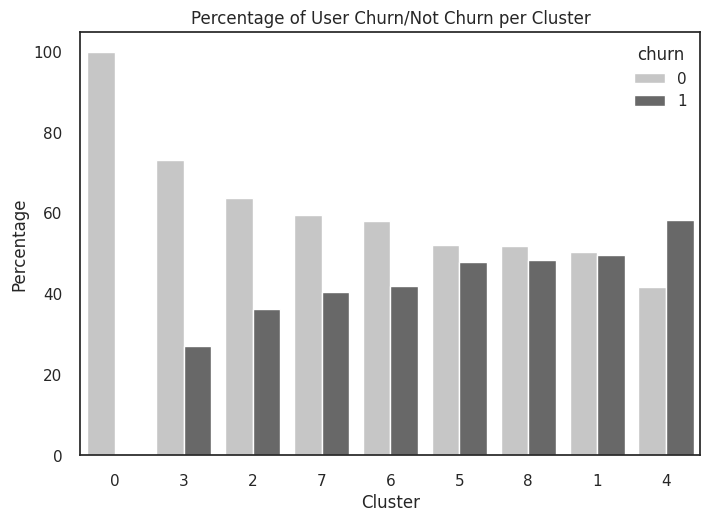

In [ ]:
sns.set_theme(style='white', palette=None)
df_clusterchurn1 = df_clusterchurn.copy()
chart = sns.barplot(x='cluster_kmeans', y='proportion',
                    hue='churn', palette='Greys',
                    data=df_clusterchurn1, order=df_clusterchurn1.query('churn==1').sort_values('proportion')['cluster_kmeans'])
# chart.bar_label(chart.containers[0], fmt='%.1f%%')
plt.title('Percentage of User Churn/Not Churn per Cluster')
plt.ylabel('Percentage')
plt.xlabel('Cluster')
plt.savefig('plot10.png', dpi=200, bbox_inches='tight', transparent=True)
plt.show()

##Visualization

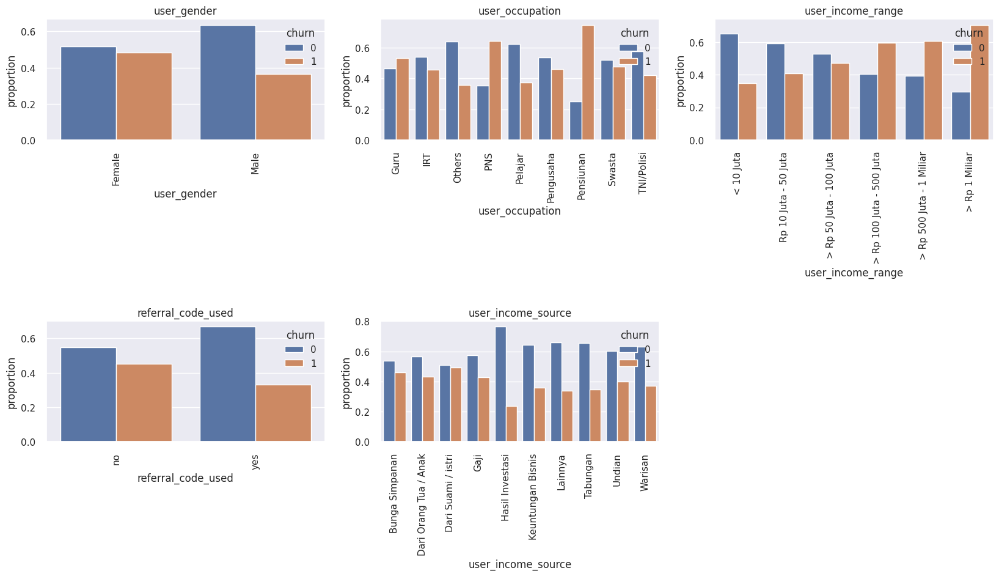

In [ ]:
df_plot = df_churneda.copy()

df_plot['user_income_range'] = df_plot['user_income_range'].astype('category').cat.reorder_categories(
    ['< 10 Juta', 'Rp 10 Juta - 50 Juta', '> Rp 50 Juta - 100 Juta', '> Rp 100 Juta - 500 Juta', '> Rp 500 Juta - 1 Miliar', '> Rp 1 Miliar']
)

obj_column = df_plot.select_dtypes(include=[object, 'category']).columns.to_list()

fig = plt.figure(figsize=(20,150))
rows = math.ceil(float(df_plot.shape[1]/3))

idx = 1

for col in obj_column:
  if col == 'user_id' or col =='churn':
    continue

  ax = fig.add_subplot(rows,3,idx)
  idx+=1
  ax.set_title(col)

  chart = sns.barplot(x=col,
              y='proportion',
              hue='churn',
              data=df_plot.groupby(col, as_index=False)['churn'].value_counts(normalize=True))
  chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

  plt.subplots_adjust(hspace=1.5)

plt.savefig('plot10.png', dpi=200, bbox_inches='tight')

In [ ]:
df_plot_occupation

,user_occupation,churn,proportion
0,Guru,1,53.23
1,Guru,0,46.77
2,IRT,0,54.08
3,IRT,1,45.92
4,Others,0,64.25
5,Others,1,35.75
6,PNS,1,64.66
7,PNS,0,35.34
8,Pelajar,0,62.66
9,Pelajar,1,37.34


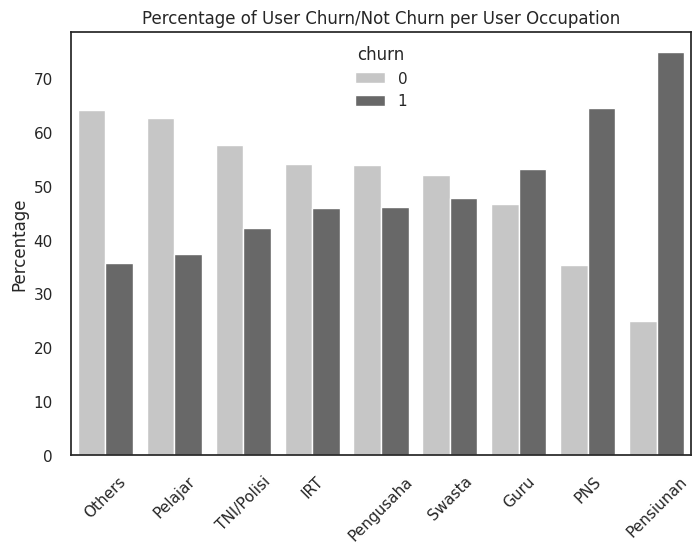

In [ ]:
df_plot_occupation = df_plot.groupby('user_occupation', as_index=False)['churn'].value_counts(normalize=True)
df_plot_occupation['proportion'] = df_plot_occupation['proportion']*100

chart = sns.barplot(x='user_occupation',
              y='proportion',
              hue='churn',
              palette='Greys',
              order=df_plot_occupation.query('churn==1').sort_values('proportion')['user_occupation'],
              data=df_plot_occupation)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title('Percentage of User Churn/Not Churn per User Occupation')
plt.xlabel('')
plt.ylabel('Percentage')
plt.savefig('plot11.png', dpi=200, bbox_inches='tight', transparent=True)
plt.show()

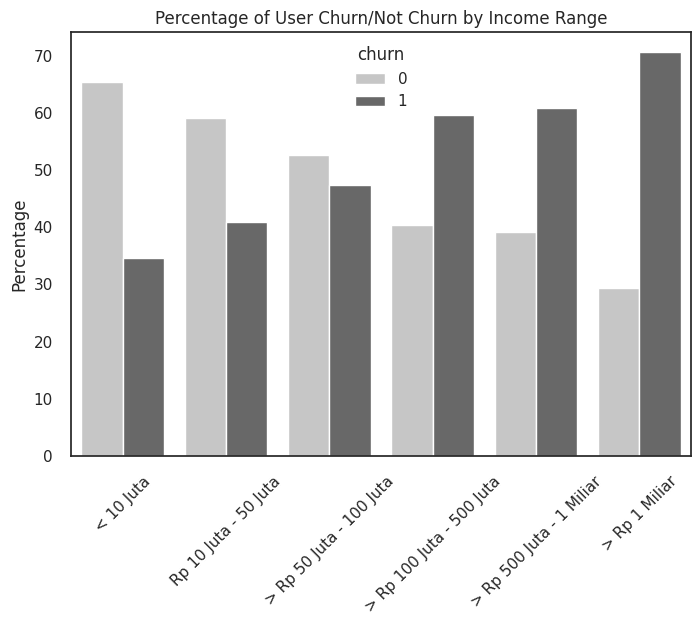

In [ ]:
df_plot_income = df_plot.groupby('user_income_range', as_index=False)['churn'].value_counts(normalize=True)
df_plot_income['user_income_range'] = df_plot_income['user_income_range'].astype('category').cat.reorder_categories(
    ['< 10 Juta', 'Rp 10 Juta - 50 Juta', '> Rp 50 Juta - 100 Juta', '> Rp 100 Juta - 500 Juta', '> Rp 500 Juta - 1 Miliar', '> Rp 1 Miliar']
)
df_plot_income['proportion'] = df_plot_income['proportion']*100

chart = sns.barplot(x='user_income_range',
              y='proportion',
              hue='churn',
              palette='Greys',
              data=df_plot_income)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45)
plt.title('Percentage of User Churn/Not Churn by Income Range')
plt.xlabel('')
plt.ylabel('Percentage')
plt.savefig('plot12.png', dpi=200, bbox_inches='tight', transparent=True)
plt.show()

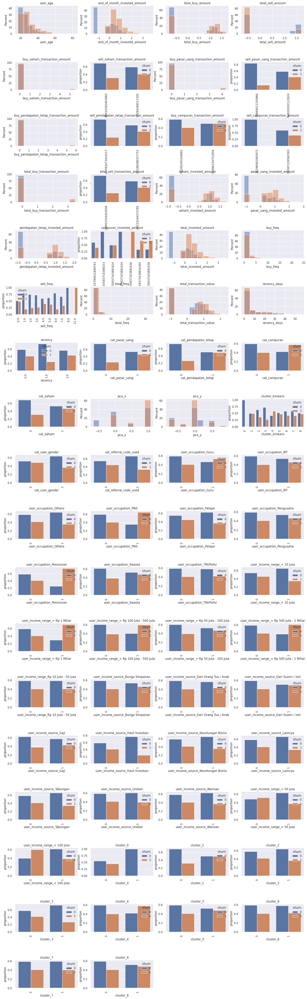

In [ ]:
df_plot = df_churneda.copy()

df_dum = pd.get_dummies(data=df_plot, columns=['cluster_kmeans'], prefix=['cluster'], drop_first=False)
df_plot = df_plot.merge(df_dum)

num_column = df_plot.select_dtypes(include=[np.number]).columns.to_list()

pt=PowerTransformer()
for i in num_column:
  if df_plot[i].max()>1000 or df_plot[i].min()<-1000:
    df_plot[[i]] = pt.fit_transform(df_plot[[i]])

fig = plt.figure(figsize=(21,80))
rows = math.ceil(float(df_plot.shape[1]/4))

idx = 1

for col in num_column:
  if col == 'user_id' or col =='churn':
    continue

  ax = fig.add_subplot(rows,4,idx)
  idx+=1
  ax.set_title(col)

  if df_plot[col].nunique()>10:
    sns.histplot(x=col,
              data=df_plot[df_plot['churn']==0],
              stat='percent',
              bins=10,
              ax=ax,
              alpha=0.5)
    sns.histplot(x=col,
              data=df_plot[df_plot['churn']==1],
              stat='percent',
              bins=10,
              ax=ax,
              alpha=0.5)
  else:
    chart = sns.barplot(x=col,
                y='proportion',
                hue='churn',
                data=df_plot.groupby(col, as_index=False)['churn'].value_counts(normalize=True))
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

  plt.subplots_adjust(hspace=1)

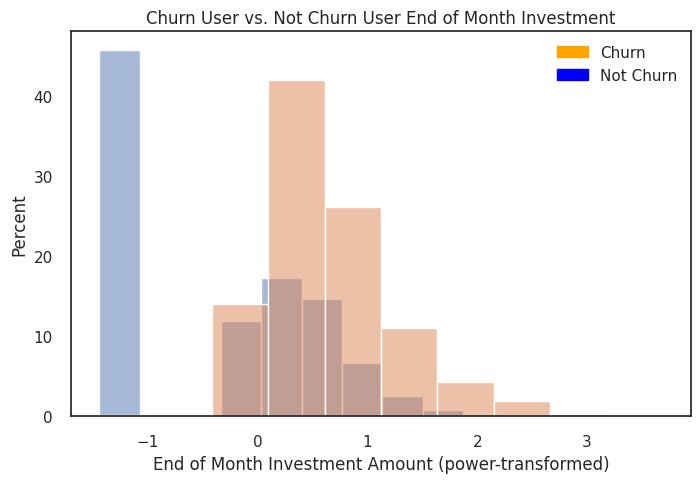

In [ ]:
import matplotlib.patches as mpatches

fig = plt.figure(figsize=(8,5))
sns.histplot(x='end_of_month_invested_amount',
              data=df_plot[df_plot['churn']==0],
              stat='percent',
              bins=10,
              alpha=0.5)
sns.histplot(x='end_of_month_invested_amount',
              data=df_plot[df_plot['churn']==1],
              stat='percent',
              bins=10,
              alpha=0.5)
plt.title('Churn User vs. Not Churn User End of Month Investment')
plt.xlabel('End of Month Investment Amount (power-transformed)')

orange_patch = mpatches.Patch(color='orange', label='Churn')
blue_patch = mpatches.Patch(color='blue', label='Not Churn')
plt.legend(handles=[orange_patch, blue_patch])

plt.savefig('plot13.png', dpi=200, bbox_inches='tight', transparent=True)
plt.show()

Insight:

Guru, Pensiunan and PNS churn more than other group

People with income range more than 100 juta churn more

People that have end of month investment tend to churn

Almost all user in cluster 0 don't churn

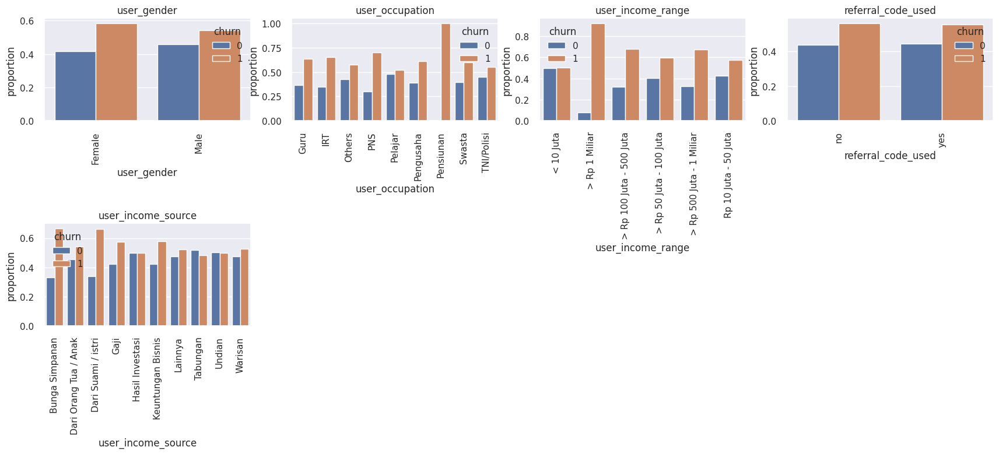

In [ ]:
df_plot = df_churneda.copy()

df_plot['cat_eom_amount'] = np.where(df_plot['end_of_month_invested_amount']>0, 1, 0)

df_plot0 = df_plot.query("cat_eom_amount==0")
df_plot1 = df_plot.query("cat_eom_amount==1")

obj_column = df_plot.select_dtypes(include=[object]).columns.to_list()

fig = plt.figure(figsize=(21,80))
rows = math.ceil(float(df_plot.shape[1]/4))

idx = 1

for col in obj_column:
  if col == 'user_id' or col =='churn':
    continue

  ax = fig.add_subplot(rows,4,idx)
  idx+=1
  ax.set_title(col)

  chart1 = sns.barplot(x=col,
              y='proportion',
              hue='churn',
              data=df_plot1.groupby(col, as_index=False)['churn'].value_counts(normalize=True))
  chart1.set_xticklabels(chart1.get_xticklabels(), rotation=90)

  plt.subplots_adjust(hspace=1)

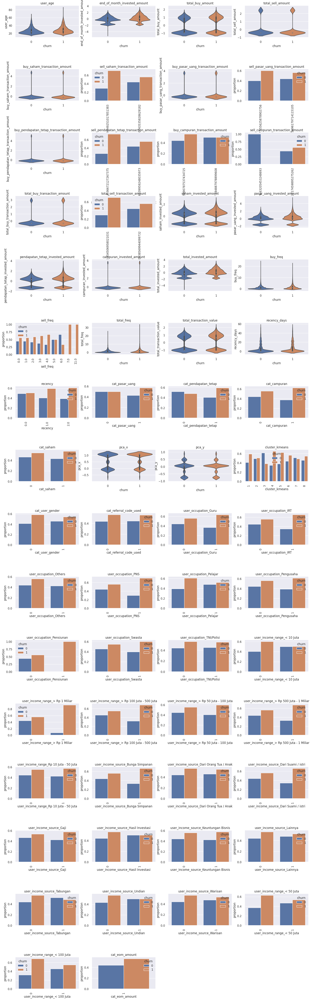

In [ ]:
df_plot = df_churneda.copy()

df_plot['cat_eom_amount'] = np.where(df_plot['end_of_month_invested_amount']>0, 1, 0)

df_plot0 = df_plot.query("cat_eom_amount==0")
df_plot1 = df_plot.query("cat_eom_amount==1")

num_column = df_plot1.select_dtypes(include=[np.number]).columns.to_list()

pt=PowerTransformer()
for i in num_column:
  if df_plot1[i].max()>1000 or df_plot1[i].min()<-1000:
    df_plot1[[i]] = pt.fit_transform(df_plot1[[i]])

fig = plt.figure(figsize=(21,80))
rows = math.ceil(float(df_plot.shape[1]/4))

idx = 1

for col in num_column:
  if col == 'user_id' or col =='churn':
    continue

  ax = fig.add_subplot(rows,4,idx)
  idx+=1
  ax.set_title(col)

  if df_plot1[col].nunique()>10:
    sns.violinplot(x='churn',
                   y=col,
                   data=df_plot1,
                   ax=ax)

  else:
    chart = sns.barplot(x=col,
                y='proportion',
                hue='churn',
                data=df_plot1.groupby(col, as_index=False)['churn'].value_counts(normalize=True))
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

  plt.subplots_adjust(hspace=1)

###Adding Feature

In [ ]:
df_churneda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8484 entries, 0 to 8483
Data columns (total 70 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   user_id                                     8484 non-null   int64         
 1   churn                                       8484 non-null   int64         
 2   registration_import_datetime                8484 non-null   datetime64[ns]
 3   user_gender                                 8484 non-null   object        
 4   user_age                                    8484 non-null   int64         
 5   user_occupation                             8484 non-null   object        
 6   user_income_range                           8484 non-null   object        
 7   referral_code_used                          8484 non-null   object        
 8   user_income_source                          8484 non-null   object        
 9   end_of_m

In [ ]:
df_churneda['user_income_range'] = df_churneda['user_income_range'].astype('category')
df_churneda['user_income_range'].unique()

['Rp 10 Juta - 50 Juta', '> Rp 100 Juta - 500 Juta', '> Rp 50 Juta - 100 Juta', '< 10 Juta', '> Rp 500 Juta - 1 Miliar', '> Rp 1 Miliar']
Categories (6, object): ['< 10 Juta', '> Rp 1 Miliar', '> Rp 100 Juta - 500 Juta',
                         '> Rp 50 Juta - 100 Juta', '> Rp 500 Juta - 1 Miliar', 'Rp 10 Juta - 50 Juta']

In [ ]:
df_churneda['user_income_range'] = df_churneda['user_income_range'].cat.reorder_categories(
    ['< 10 Juta', 'Rp 10 Juta - 50 Juta', '> Rp 50 Juta - 100 Juta', '> Rp 100 Juta - 500 Juta', '> Rp 500 Juta - 1 Miliar', '> Rp 1 Miliar']
)

In [ ]:
df_churneda['cat_user_income'] = df_churneda['user_income_range'].cat.codes

In [ ]:
replacement_di = {'< 10 Juta': 0, 'Rp 10 Juta - 50 Juta': 10000000, '> Rp 50 Juta - 100 Juta': 50000000,
                  '> Rp 100 Juta - 500 Juta': 100000000, '> Rp 500 Juta - 1 Miliar': 500000000,
                  '> Rp 1 Miliar': 1000000000}
df_churneda['min_user_income'] = df_churneda['user_income_range'].map(replacement_di).astype(int)

In [ ]:
df_churneda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8484 entries, 0 to 8483
Data columns (total 72 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   user_id                                     8484 non-null   int64         
 1   churn                                       8484 non-null   int64         
 2   registration_import_datetime                8484 non-null   datetime64[ns]
 3   user_gender                                 8484 non-null   object        
 4   user_age                                    8484 non-null   int64         
 5   user_occupation                             8484 non-null   object        
 6   user_income_range                           8484 non-null   category      
 7   referral_code_used                          8484 non-null   object        
 8   user_income_source                          8484 non-null   object        
 9   end_of_m

##Visualization (cont'd)

In [ ]:
num_column = df_churneda.select_dtypes(include=[np.number]).columns.to_list()
num_column = list(set(num_column) - set(['user_id', 'churn']))

binary_column = ['churn']
poly_column = ['churn']
float_column = ['churn']

for i in num_column:
  if df_churneda[i].nunique() == 2:
    binary_column.append(i)
  elif df_churneda[i].dtype == 'float64':
    float_column.append(i)
  else:
    poly_column.append(i)

In [ ]:
df_plot=df_churneda.copy()

pt=PowerTransformer()
for i in num_column:
  if df_plot[i].max()>1000 or df_plot[i].min()<-1000:
    df_plot[[i]] = pt.fit_transform(df_plot[[i]])

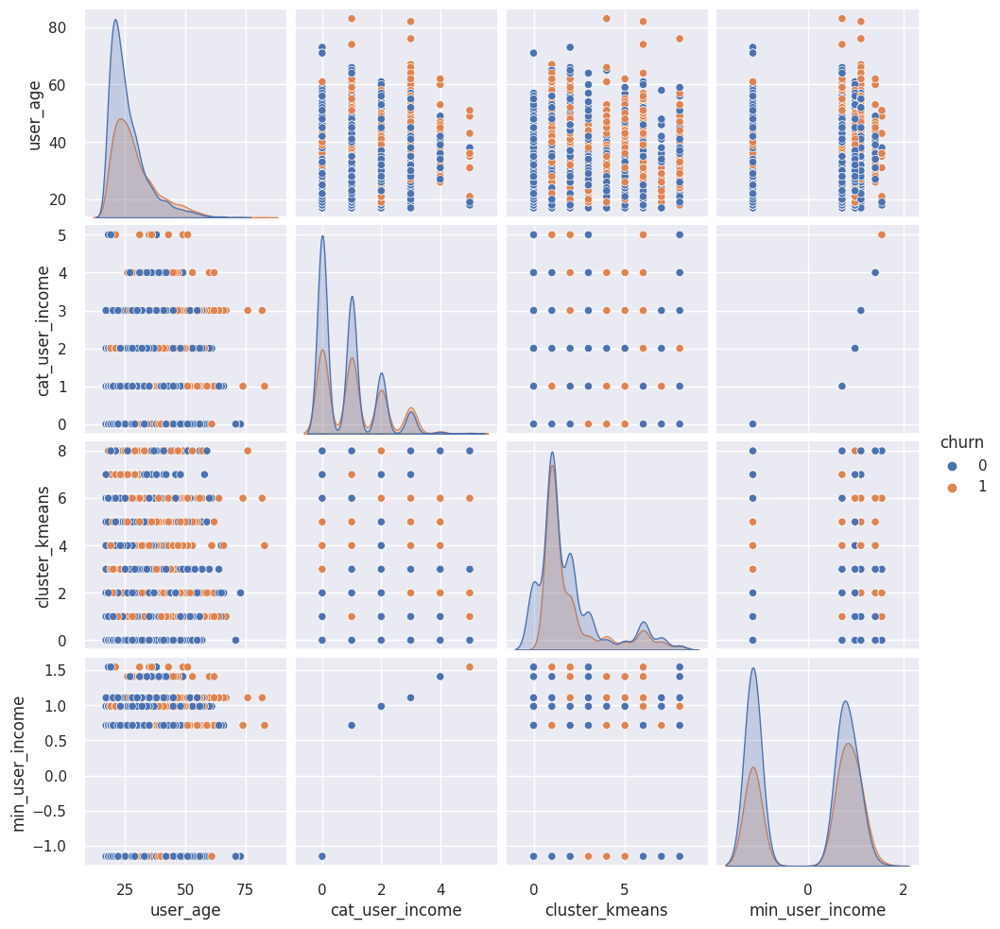

In [ ]:
sns.pairplot(data=df_plot[poly_column], hue='churn')

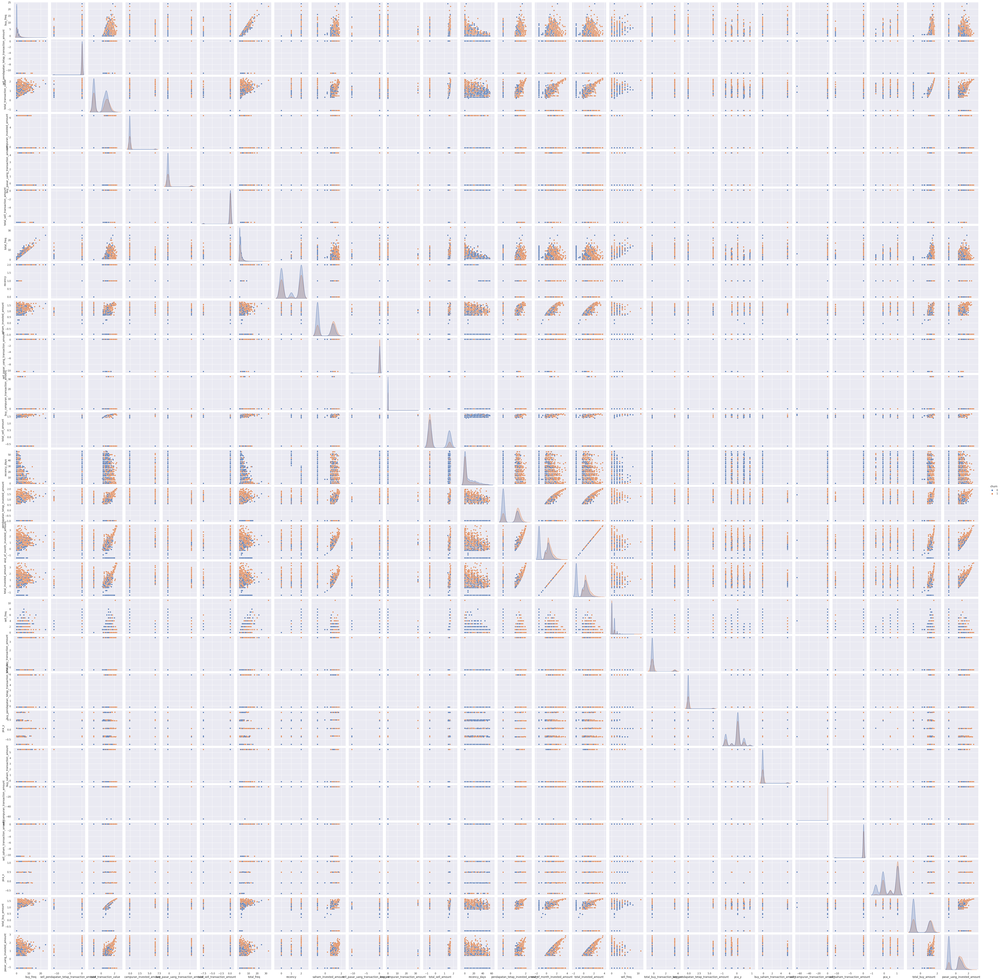

In [ ]:
sns.pairplot(data=df_plot[float_column], hue='churn')

#5. Classification

In [ ]:
df_classification = df_churneda.copy()

In [ ]:
df_classification.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8484 entries, 0 to 8483
Data columns (total 70 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   user_id                                     8484 non-null   int64         
 1   churn                                       8484 non-null   int64         
 2   registration_import_datetime                8484 non-null   datetime64[ns]
 3   user_gender                                 8484 non-null   object        
 4   user_age                                    8484 non-null   int64         
 5   user_occupation                             8484 non-null   object        
 6   user_income_range                           8484 non-null   object        
 7   referral_code_used                          8484 non-null   object        
 8   user_income_source                          8484 non-null   object        
 9   end_of_m

In [ ]:
df_dum = pd.get_dummies(data=df_classification, columns=['cluster_kmeans'], prefix=['cluster'], drop_first=False)
df_classification = df_classification.merge(df_dum)

### Multicolinearity

In [ ]:
# Ambil semua kolom yang tipenya sudah numerik
corr_column = df_classification.select_dtypes(include=[np.number]).columns.to_list()
corr_column = list(set(corr_column) - set(['user_id']))
corr_column

['user_occupation_Pensiunan',
 'user_income_source_Tabungan',
 'cat_referral_code_used',
 'user_income_source_Gaji',
 'cat_pendapatan_tetap',
 'end_of_month_invested_amount',
 'buy_pendapatan_tetap_transaction_amount',
 'cluster_6',
 'user_income_source_Warisan',
 'campuran_invested_amount',
 'user_age',
 'user_occupation_Guru',
 'user_income_source_Hasil Investasi',
 'cluster_3',
 'user_income_range_> Rp 50 Juta - 100 Juta',
 'sell_freq',
 'user_income_source_Undian',
 'cat_saham',
 'user_income_range_> Rp 100 Juta - 500 Juta',
 'user_occupation_TNI/Polisi',
 'buy_freq',
 'user_income_source_Lainnya',
 'cat_pasar_uang',
 'user_occupation_Pengusaha',
 'cat_campuran',
 'cluster_4',
 'user_occupation_Pelajar',
 'total_invested_amount',
 'user_income_range_> Rp 1 Miliar',
 'cluster_5',
 'pca_x',
 'user_occupation_Swasta',
 'user_income_range_< 100 Juta',
 'cluster_2',
 'buy_campuran_transaction_amount',
 'total_sell_transaction_amount',
 'cluster_7',
 'pendapatan_tetap_invested_amount',
 

In [ ]:
for i in corr_column:
  if df_classification[i].nunique() == 1:
    df_classification.drop(columns=i, inplace=True)

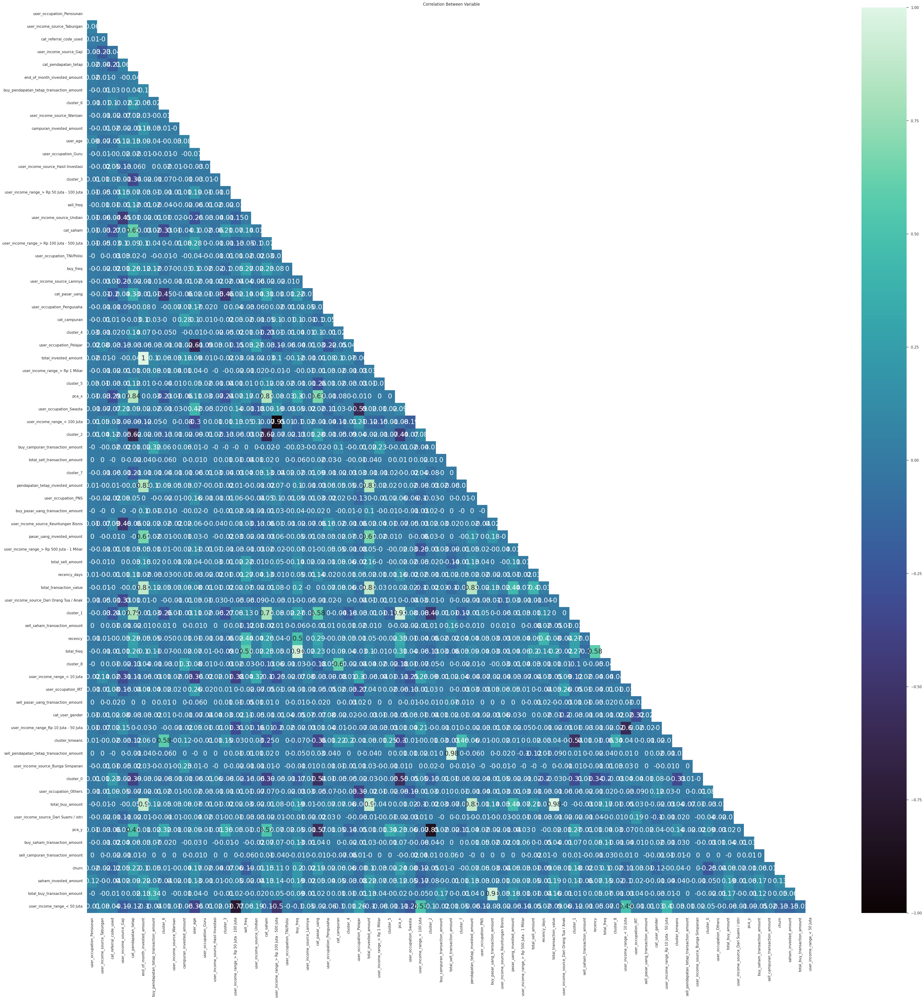

In [ ]:
fig = plt.figure(figsize=(50,50))

ax = fig.add_subplot(1, 1, 1)
ax.set_title('Correlation Between Variable')

# Supaya matriks korelasi yang terlihat cuman bagian bawahnya
mask = np.triu(np.ones_like(
    df_classification[corr_column].corr(), dtype=np.bool))

sns.heatmap(df_classification[corr_column].corr().round(2),vmin=-1,
            vmax=1,cmap='mako',annot=True,mask=mask,
            annot_kws={"fontsize":20})

plt.show()

In [ ]:
# Create correlation matrix
corr_matrix = df_classification[corr_column].corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.7, and add into to_drop list
to_drop = [column for column in upper.columns if any(upper[column] > 0.7)]
to_drop

['total_invested_amount',
 'pca_x',
 'user_income_range_< 100 Juta',
 'pendapatan_tetap_invested_amount',
 'total_transaction_value',
 'cluster_1',
 'total_freq',
 'sell_pendapatan_tetap_transaction_amount',
 'total_buy_amount',
 'pca_y',
 'total_buy_transaction_amount',
 'user_income_range_< 50 Juta']

In [ ]:
to_keep = list(set(corr_column) - set(to_drop))
to_keep

['user_occupation_Pensiunan',
 'user_income_source_Tabungan',
 'cat_referral_code_used',
 'user_income_source_Gaji',
 'cat_pendapatan_tetap',
 'end_of_month_invested_amount',
 'buy_pendapatan_tetap_transaction_amount',
 'cluster_6',
 'user_income_source_Warisan',
 'campuran_invested_amount',
 'user_age',
 'user_occupation_Guru',
 'user_income_source_Hasil Investasi',
 'cluster_3',
 'user_income_range_> Rp 50 Juta - 100 Juta',
 'sell_freq',
 'user_income_source_Undian',
 'cat_saham',
 'user_income_range_> Rp 100 Juta - 500 Juta',
 'user_occupation_TNI/Polisi',
 'buy_freq',
 'user_income_source_Lainnya',
 'cat_pasar_uang',
 'user_occupation_Pengusaha',
 'cat_campuran',
 'cluster_4',
 'user_occupation_Pelajar',
 'user_income_range_> Rp 1 Miliar',
 'cluster_5',
 'user_occupation_Swasta',
 'cluster_2',
 'buy_campuran_transaction_amount',
 'total_sell_transaction_amount',
 'cluster_7',
 'user_occupation_PNS',
 'buy_pasar_uang_transaction_amount',
 'user_income_source_Keuntungan Bisnis',
 'pa

In [ ]:
len(to_keep)

59

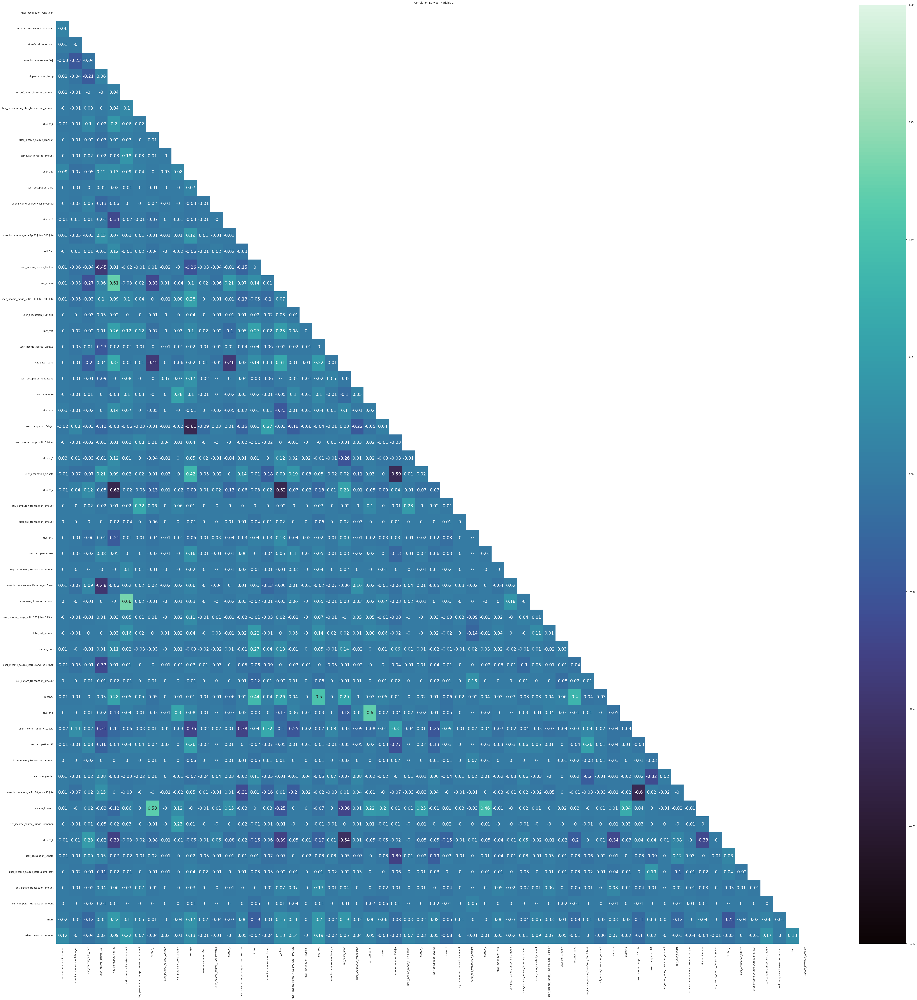

In [ ]:
corr_column_new = to_keep

fig = plt.figure(figsize=(80,80))

ax = fig.add_subplot(1, 1, 1)
ax.set_title('Correlation Between Variable 2')

mask = np.triu(np.ones_like(
    df_classification[corr_column_new].corr(), dtype=np.bool))
sns.heatmap(df_classification[corr_column_new].corr().round(2),vmin=-1,
            vmax=1,cmap='mako',annot=True,mask=mask,
            annot_kws={"fontsize":20})

plt.show()

In [ ]:
# Separate Churn from other variables
to_keep_vars = list(set(to_keep) - set(['churn', 'pca_x', 'pca_y']))
to_keep_vars

['user_occupation_Pensiunan',
 'user_income_source_Tabungan',
 'cat_referral_code_used',
 'user_income_source_Gaji',
 'cluster_2',
 'buy_campuran_transaction_amount',
 'total_sell_transaction_amount',
 'cat_pendapatan_tetap',
 'cluster_7',
 'user_occupation_PNS',
 'end_of_month_invested_amount',
 'buy_pendapatan_tetap_transaction_amount',
 'buy_pasar_uang_transaction_amount',
 'cluster_6',
 'user_income_source_Warisan',
 'user_income_source_Keuntungan Bisnis',
 'campuran_invested_amount',
 'pasar_uang_invested_amount',
 'user_income_range_> Rp 500 Juta - 1 Miliar',
 'total_sell_amount',
 'recency_days',
 'user_age',
 'user_income_source_Dari Orang Tua / Anak',
 'sell_saham_transaction_amount',
 'recency',
 'user_occupation_Guru',
 'cluster_8',
 'user_income_source_Hasil Investasi',
 'user_income_range_< 10 Juta',
 'cluster_3',
 'user_occupation_IRT',
 'sell_pasar_uang_transaction_amount',
 'cat_user_gender',
 'user_income_range_Rp 10 Juta - 50 Juta',
 'user_income_range_> Rp 50 Juta - 

In [ ]:
len(to_keep_vars)

58

###Feature and Model Selection

In [ ]:
bench_col = list(set(corr_column) - set(['churn']))

X= df_classification[bench_col].copy()
y= df_classification[['churn']].copy()

X_btrain, X_btest, y_btrain, y_btest = train_test_split(X, y, test_size = 0.2, shuffle=True, stratify=y, random_state=10)

In [ ]:
#benchmark
lr_bench = LogisticRegression(random_state=10)

lr_bench.fit(X_btrain, y_btrain)
y_pred_lrbench = lr_bench.predict(X_btest)
print(f1_score(y_true = y_btest, y_pred = y_pred_lrbench))

0.7064464571124134


In [ ]:
#Determine lambda for PowerTransformer

X_train = X_btrain[to_keep_vars].copy()
X_test= X_btest[to_keep_vars].copy()
y_train = y_btrain.copy()
y_test= y_btest.copy()

pt = PowerTransformer()
lmd_dict = {}

for i in X_train.columns:
  if X_train[i].max()>1000 or X_train[i].min()<-1000:
    X_train[[i]] = pt.fit_transform(X_train[[i]])
    lmd_dict[i] = pt.lambdas_

print(lmd_dict)

{'buy_campuran_transaction_amount': array([-63.24609475]), 'total_sell_transaction_amount': array([7.41918281]), 'end_of_month_invested_amount': array([0.09217723]), 'buy_pendapatan_tetap_transaction_amount': array([-2.78656938]), 'buy_pasar_uang_transaction_amount': array([-1.62222004]), 'campuran_invested_amount': array([-2.70124729]), 'pasar_uang_invested_amount': array([0.02090428]), 'total_sell_amount': array([-0.23730006]), 'sell_saham_transaction_amount': array([12.0680692]), 'sell_pasar_uang_transaction_amount': array([13.57385265]), 'buy_saham_transaction_amount': array([-2.62843101]), 'sell_campuran_transaction_amount': array([260.60423394]), 'saham_invested_amount': array([-0.03566215])}


In [ ]:
for i,lmd in lmd_dict.items():
  if i in X_test.columns:
    X_test[i] = yeojohnson(X_test[i], lmbda=lmd)

#### Logistic Regression

In [ ]:
lr = LogisticRegression(random_state=10)

In [ ]:
di_lrf1 = {}
di_lrfeature = {}

for n in range(1,len(to_keep_vars)):

  # Use RFE to select the top features
  rfe = RFE(LogisticRegression(random_state=10), n_features_to_select=n)
  rfe.fit(X_train, y_train)

  # Obtain selected features
  selected_features = X_train.columns[rfe.support_]

  # Print the score
  di_lrf1[n] = np.mean(cross_val_score(lr, X_train[selected_features], y_train, scoring='f1', cv=5))
  di_lrfeature[n] = selected_features

In [ ]:
print(di_lrf1)
print(max(di_lrf1, key=di_lrf1.get), max(di_lrf1.values()))

best_lr_feature = di_lrfeature[max(di_lrf1, key=di_lrf1.get)]
print(best_lr_feature)

{1: 0.0, 2: 0.6330121904034323, 3: 0.6327093475389608, 4: 0.6362960047611905, 5: 0.6367459011967849, 6: 0.6366159058453429, 7: 0.6372799261602051, 8: 0.6379883052410482, 9: 0.6379883052410482, 10: 0.6377421527846049, 11: 0.6379701170066029, 12: 0.6380095879903733, 13: 0.6291518952316588, 14: 0.6291518952316588, 15: 0.6348664256370509, 16: 0.6554794815181092, 17: 0.6554843673376208, 18: 0.6477141944235375, 19: 0.6459827354542063, 20: 0.6485526673334097, 21: 0.6475086382752101, 22: 0.6464173362001759, 23: 0.6462754046964475, 24: 0.6456641203955599, 25: 0.6456764277469559, 26: 0.6476025173272704, 27: 0.6456425850882621, 28: 0.6453054438202394, 29: 0.6413348318353667, 30: 0.6415733674694617, 31: 0.6421030994513481, 32: 0.642094075885199, 33: 0.643001745433454, 34: 0.6427698300669825, 35: 0.6430160810662456, 36: 0.6423055788539983, 37: 0.64179351473743, 38: 0.64179351473743, 39: 0.6431115063141698, 40: 0.6426831322974083, 41: 0.6425405239333698, 42: 0.6407207022815287, 43: 0.640019554812613

In [ ]:
di_lrfeature[2]

Index(['cluster_0', 'total_invested_amount'], dtype='object')

In [ ]:
#Manual
lr.fit(X_train[['total_invested_amount', 'cluster_0']], y_train)
y_pred = lr.predict(X_test[['total_invested_amount', 'cluster_0']])
print(f1_score(y_true = y_test, y_pred = y_pred))

0.7159855147439214


In [ ]:
#Optimized
lr = LogisticRegression(random_state=10)

lr.fit(X_train[best_lr_feature], y_train)
y_pred = lr.predict(X_test[best_lr_feature])
print(f1_score(y_true = y_test, y_pred = y_pred))

0.7159855147439214


####Gradient Boosting

In [ ]:
gbc = GradientBoostingClassifier(random_state=10)

In [ ]:
di_gbcf1 = {}
di_gbcfeature = {}

for n in range(1,len(to_keep_vars)):

  # Use RFE to select the top features
  rfe = RFE(gbc, n_features_to_select=n)
  rfe.fit(X_train, y_train)

  # Obtain selected features
  selected_features = X_train.columns[rfe.support_]

  # Print the score
  di_gbcf1[n] = np.mean(cross_val_score(gbc, X_train[selected_features], y_train, scoring='f1', cv=5))
  di_gbcfeature[n] = selected_features

In [ ]:
print(di_gbcf1)
print(max(di_gbcf1, key=di_gbcf1.get), max(di_gbcf1.values()))

best_gbc_feature = di_gbcfeature[max(di_gbcf1, key=di_gbcf1.get)]
print(best_gbc_feature)

{1: 0.691722159083076, 2: 0.6717618086331709, 3: 0.6697515444591946, 4: 0.6695074702926077, 5: 0.6712995680572925, 6: 0.666917182006564, 7: 0.6657783948187321, 8: 0.667284462287997, 9: 0.6704399406403454, 10: 0.6684051409032158, 11: 0.6726561723174858, 12: 0.6695982280195727, 13: 0.6696490710671336, 14: 0.6699792365141622, 15: 0.6694016517292075, 16: 0.6717466978288796, 17: 0.6718281880299155, 18: 0.672348350549381, 19: 0.6705028810954742, 20: 0.6702157894482166, 21: 0.6698462417586262, 22: 0.6703516504348166, 23: 0.6746569581467152, 24: 0.6688627593824062, 25: 0.6686764294205043, 26: 0.668787502912347, 27: 0.668022160746264, 28: 0.671809834525781, 29: 0.6714936051037467, 30: 0.6728488131729629, 31: 0.671825783121002, 32: 0.6719349946974292, 33: 0.6722440035279192, 34: 0.670334839968447, 35: 0.6712442457710835, 36: 0.6723009344940298, 37: 0.6718147998280035, 38: 0.6721100072154242, 39: 0.6719102338614945, 40: 0.6723848995581255, 41: 0.6729344290575827, 42: 0.6727144310650578, 43: 0.672

In [ ]:
di_gbcfeature[2]

Index(['total_invested_amount', 'user_age'], dtype='object')

In [ ]:
#Manual
gbc.fit(X_train[['end_of_month_invested_amount', 'cluster_0',
                 'user_occupation_Guru', 'user_occupation_PNS', 'user_occupation_Pensiunan',
                 'user_income_range_> Rp 100 Juta - 500 Juta', 'user_income_range_> Rp 500 Juta - 1 Miliar',
                 'user_income_range_> Rp 1 Miliar']], y_train)
y_pred = gbc.predict(X_test[['end_of_month_invested_amount', 'cluster_0',
                 'user_occupation_Guru', 'user_occupation_PNS', 'user_occupation_Pensiunan',
                 'user_income_range_> Rp 100 Juta - 500 Juta', 'user_income_range_> Rp 500 Juta - 1 Miliar',
                 'user_income_range_> Rp 1 Miliar']])
print(f1_score(y_true = y_test, y_pred = y_pred))

0.5807531380753138


In [ ]:
#Optimized
gbc.fit(X_train[best_gbc_feature], y_train)
y_pred = gbc.predict(X_test[best_gbc_feature])
print(f1_score(y_true = y_test, y_pred = y_pred))

0.5805102467586783


In [ ]:
def objective1(trial):
  max_depth = int(trial.suggest_int('max_depth', 3, 10, 1))
  min_samples_split = int(trial.suggest_int('min_samples_split', 50, 500, 50))
  min_samples_leaf = int(trial.suggest_int('min_samples_leaf', 10, 200, 10))
  gbc = GradientBoostingClassifier(max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf, random_state=10)
  return cross_val_score(gbc, X_train[best_gbc_feature], y_train, n_jobs=-1, cv=5, scoring='f1').mean()

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective1, n_trials=100)

[I 2023-04-26 11:53:26,498] A new study created in memory with name: no-name-ffb4bc78-0604-4178-9a77-f3c0e57d2813
[I 2023-04-26 11:53:30,234] Trial 0 finished with value: 0.6773423885176624 and parameters: {'max_depth': 3, 'min_samples_split': 100, 'min_samples_leaf': 180}. Best is trial 0 with value: 0.6773423885176624.
[I 2023-04-26 11:53:31,778] Trial 1 finished with value: 0.6861701964575001 and parameters: {'max_depth': 9, 'min_samples_split': 200, 'min_samples_leaf': 190}. Best is trial 1 with value: 0.6861701964575001.
[I 2023-04-26 11:53:32,815] Trial 2 finished with value: 0.673142549656901 and parameters: {'max_depth': 3, 'min_samples_split': 500, 'min_samples_leaf': 120}. Best is trial 1 with value: 0.6861701964575001.
[I 2023-04-26 11:53:35,935] Trial 3 finished with value: 0.6821463796890084 and parameters: {'max_depth': 8, 'min_samples_split': 250, 'min_samples_leaf': 10}. Best is trial 1 with value: 0.6861701964575001.
[I 2023-04-26 11:53:38,013] Trial 4 finished with va

In [ ]:
trial = study.best_trial
print('F1: {}'.format(trial.value))

print("Best hyperparameters: {}".format(trial.params))

F1: 0.6940493237010792
Best hyperparameters: {'max_depth': 5, 'min_samples_split': 250, 'min_samples_leaf': 40}


In [ ]:
gbc_opt = GradientBoostingClassifier(random_state=10, max_depth= 5, min_samples_split= 250, min_samples_leaf= 40)

gbc_opt.fit(X_train[best_gbc_feature], y_train)
y_pred_gbcopt = gbc_opt.predict(X_test[best_gbc_feature])
print(f1_score(y_true = y_test, y_pred = y_pred_gbcopt))

0.5805102467586783


####Random Forest

In [ ]:
rfc = RandomForestClassifier(random_state=10)

In [ ]:
di_rfcf1 = {}
di_rfcfeature = {}

for n in range(1,len(to_keep_vars)):

  # Use RFE to select the top features
  rfe = RFE(rfc, n_features_to_select=n)
  rfe.fit(X_train, y_train)

  # Obtain selected features
  selected_features = X_train.columns[rfe.support_]

  # Print the score
  di_rfcf1[n] = np.mean(cross_val_score(rfc, X_train[selected_features], y_train, scoring='f1', cv=5))
  di_rfcfeature[n] = selected_features

In [ ]:
print(di_rfcf1)
print(max(di_rfcf1, key=di_rfcf1.get), max(di_rfcf1.values()))

best_rfc_feature = di_rfcfeature[max(di_rfcf1, key=di_rfcf1.get)]
print(best_rfc_feature)

{1: 0.6667932198484292, 2: 0.6186729550308594, 3: 0.5979257235055817, 4: 0.611897465948711, 5: 0.6300092899522108, 6: 0.6363235524945198, 7: 0.6392613492438494, 8: 0.6348557604728695, 9: 0.6350280245869507, 10: 0.637211527780798, 11: 0.6410918216734262, 12: 0.6399264905526745, 13: 0.6399858090588441, 14: 0.6456475337904071, 15: 0.647574672526783, 16: 0.6404448701422134, 17: 0.6421254147293569, 18: 0.6378958511595632, 19: 0.6424001356695996, 20: 0.6436464656772618, 21: 0.6415375571503652, 22: 0.6464454344150851, 23: 0.6437307979564111, 24: 0.644638908397378, 25: 0.6457341202334044, 26: 0.6450892102093664, 27: 0.646119074857323, 28: 0.6446344879483922, 29: 0.6453504030106089, 30: 0.6509413921194277, 31: 0.6446585731804282, 32: 0.6501309897991792, 33: 0.6448634395744659, 34: 0.6409162329348652, 35: 0.646791946768795, 36: 0.6506176517019859, 37: 0.6438504959697846, 38: 0.6449801364378278, 39: 0.6491223627561167, 40: 0.6473589764748598, 41: 0.6460210798880925, 42: 0.648872343476607, 43: 0.6

In [ ]:
di_rfcfeature[2]

Index(['pasar_uang_invested_amount', 'total_invested_amount'], dtype='object')

In [ ]:
#Manual
rfc.fit(X_train[['total_invested_amount', 'cluster_0']], y_train)
y_pred = rfc.predict(X_test[['total_invested_amount', 'cluster_0']])
print(f1_score(y_true = y_test, y_pred = y_pred))

0.6154529307282416


In [ ]:
#Optimized
rfc.fit(X_train[best_rfc_feature], y_train)
y_pred = rfc.predict(X_test[best_rfc_feature])
print(f1_score(y_true = y_test, y_pred = y_pred))

0.5805102467586783


### Confusion matrix on training set

In [ ]:
# confusion_matrix(churn actual, churn prediksi)
confusion_matrix(y_train, lr.predict(X_train[best_lr_feature]))

array([[2902, 1110],
       [ 874, 1901]])

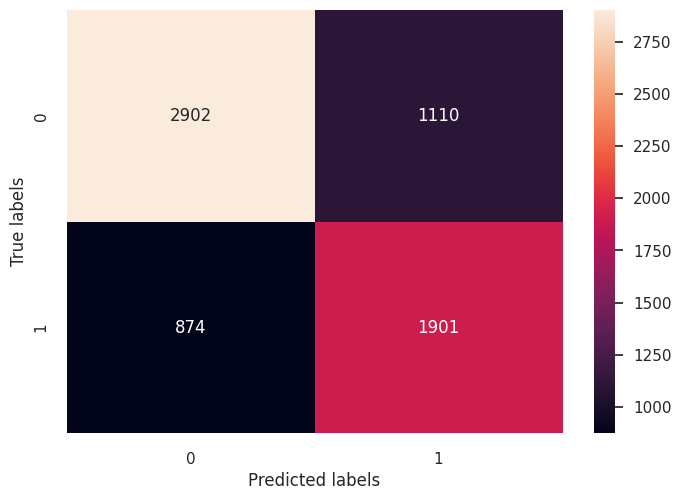

In [ ]:
# 0 : Tidak churn
# 1 : Churn
ax = plt.subplot()
sns.heatmap(confusion_matrix(y_train, lr.predict(X_train[best_lr_feature])), annot=True, fmt = 'd')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_train, lr.predict(X_train[best_lr_feature]), target_names=['Not Churn','Churn']))

              precision    recall  f1-score   support

   Not Churn       0.77      0.72      0.75      4012
       Churn       0.63      0.69      0.66      2775

    accuracy                           0.71      6787
   macro avg       0.70      0.70      0.70      6787
weighted avg       0.71      0.71      0.71      6787



### Confusion matrix on test set

In [ ]:
confusion_matrix(y_test, lr.predict(X_test[best_lr_feature]))

array([[456, 547],
       [  2, 692]])

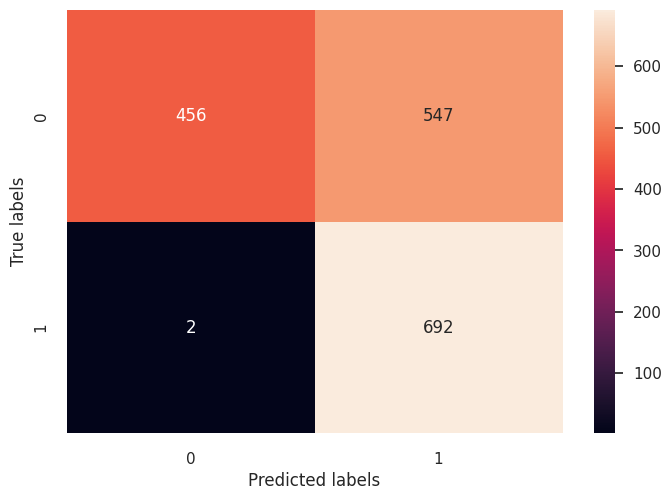

In [ ]:
ax = plt.subplot()
sns.heatmap(confusion_matrix(y_test, lr.predict(X_test[best_lr_feature])), annot=True, fmt = 'd')
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');

In [ ]:
print(classification_report(y_test, lr.predict(X_test[best_lr_feature]), target_names=['Not Churn','Churn']))

              precision    recall  f1-score   support

   Not Churn       1.00      0.45      0.62      1003
       Churn       0.56      1.00      0.72       694

    accuracy                           0.68      1697
   macro avg       0.78      0.73      0.67      1697
weighted avg       0.82      0.68      0.66      1697



### Benefit-Cost Analysis

The marketing team want to give a campaign to top 30% of users with highest probability churn.

We can first predict probability for all users, and get the top 30% users:


In [ ]:
y

,churn
0,1
1,1
2,0
3,0
4,1
...,...
8479,0
8480,0
8481,0
8482,0


In [ ]:
X

,user_income_source_Hasil Investasi,user_occupation_TNI/Polisi,user_income_range_> Rp 100 Juta - 500 Juta,total_sell_transaction_amount,pca_x,total_buy_transaction_amount,cat_saham,buy_pendapatan_tetap_transaction_amount,cat_referral_code_used,sell_pendapatan_tetap_transaction_amount,...,saham_invested_amount,user_income_source_Dari Suami / istri,cluster_4,user_age,end_of_month_invested_amount,sell_pasar_uang_transaction_amount,cluster_1,buy_pasar_uang_transaction_amount,user_occupation_Pengusaha,cat_user_income
0,0,0,0,0.00,-0.66,0.00,0,0.00,0,0.00,...,0.00,0,0,28,10000000.00,0.00,0,0.00,0,1
1,0,0,1,0.00,1.07,2100000.00,1,1200000.00,0,0.00,...,2000000.00,0,0,33,4100000.00,0.00,1,600000.00,0,3
2,0,0,0,0.00,-0.66,0.00,0,0.00,0,0.00,...,0.00,0,0,27,0.00,0.00,0,0.00,0,2
3,0,0,0,0.00,1.07,0.00,1,0.00,0,0.00,...,70000.00,0,0,29,100000.00,0.00,1,0.00,0,0
4,0,0,1,0.00,-0.09,2000000.00,0,0.00,0,0.00,...,0.00,0,0,27,12000000.00,0.00,0,2000000.00,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8479,0,0,0,0.00,-0.66,0.00,0,0.00,0,0.00,...,0.00,0,0,35,0.00,0.00,0,0.00,0,1
8480,0,0,0,0.00,-0.66,0.00,0,0.00,0,0.00,...,0.00,1,0,22,0.00,0.00,0,0.00,0,0
8481,0,0,0,0.00,-0.66,0.00,0,0.00,0,0.00,...,0.00,0,0,29,0.00,0.00,0,0.00,0,0
8482,0,0,0,0.00,-0.66,0.00,0,0.00,1,0.00,...,0.00,1,0,41,0.00,0.00,0,0.00,0,1


In [ ]:
X_predproba = X.copy()

for i,lmd in lmd_dict.items():
  if i in X_predproba.columns:
    X_predproba[i] = yeojohnson(X_predproba[i], lmbda=lmd)

In [ ]:
predicted_prob = lr.predict_proba(X_predproba[best_lr_feature])
predicted_prob = pd.DataFrame(predicted_prob[:,1], columns = ['predicted_score'])
predicted_prob = predicted_prob.merge(df_classification['cluster_kmeans'], left_index = True, right_index = True)
predicted_prob.head()

,predicted_score,cluster_kmeans
0,1.00,8
1,1.00,1
2,0.02,0
3,1.00,1
4,1.00,2


<Axes: >

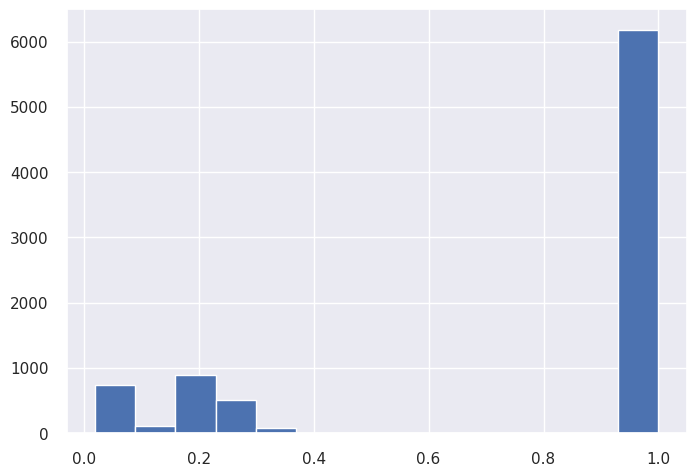

In [ ]:
predicted_prob['predicted_score'].hist(bins='fd')

In [ ]:
# Get 30% threshold
pct70_threshold = predicted_prob['predicted_score'].quantile(0.7)

# Get top 30% customers
pct70_customer = predicted_prob[predicted_prob['predicted_score'] >= pct70_threshold]

# Merge with actual churn outcome
pct70_customer = pct70_customer.merge(y, left_index = True, right_index = True)
pct70_customer.head()

,predicted_score,cluster_kmeans,churn
0,1.00,8,1
1,1.00,1,1
4,1.00,2,1
6,1.00,1,0
7,1.00,1,1


In [ ]:
pct70_customer['churn'].value_counts(normalize=True)

1   0.66
0   0.34
Name: churn, dtype: float64

#### Cluster 0

In [ ]:
cluster_0 = pct70_customer.query("cluster_kmeans == 0").copy()

In [ ]:
cluster_0['churn'].value_counts(dropna=False)

Series([], Name: churn, dtype: int64)

I won't advise marketing team to promote in cluster 0

#### Cluster 1

***Cluster 1: The Most Invested/TUS***

average total buy in this period: Rp 1,441,804.34

buy frequency: 1.37

average total sell in this period: Rp 328,237.43

sell frequency: 0.49

average total investment: Rp 2,140,047.71

pelajar is slightly more than not pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap, pasar_uang and saham, few of them also invest in campuran



In [ ]:
cluster_1 = pct70_customer.query("cluster_kmeans == 1").copy()

In [ ]:
cluster_1['churn'].value_counts(dropna=False)

1    1165
0     591
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 1441804.34 * 1165) + (0.15/100 * 328237.43 * 1165) - (1000 * (1165+591)),0)

1337148.0

#### Cluster 2

***Cluster 2: Money Market Investor/U***

average total buy in this period: Rp 706,589.16

buy frequency: 0.45

average total sell in this period: Rp 136,624.31

sell frequency: 0.34

average total investment: Rp 1,509,852.81

mostly are pelajar, user with income <10 juta is slightly more than user with income >10juta, source of income is Gaji

all of them invest in pasar_uang, few of them also invest in campuran



In [ ]:
cluster_2 = pct70_customer.query("cluster_kmeans == 2").copy()

In [ ]:
cluster_2['churn'].value_counts(dropna=False)

1    179
0     87
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 706589.16 * 179) + (0.15/100 * 136624.31 * 179) - (1000 * (179+87)),0)

-39597.0

#### Cluster 3

***Cluster 3: The Equity Investor/S***

average total buy in this period: Rp 92,256.86

buy frequency: 0.28

average total sell in this period: Rp 107,992.35

sell frequency: 0.35

average total investment: Rp 301,591.80

mostly are pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in saham, few of them also invest in campuran

In [ ]:
cluster_3 = pct70_customer.query("cluster_kmeans == 3").copy()

In [ ]:
cluster_3['churn'].value_counts(dropna=False)

0    37
1    33
Name: churn, dtype: int64

In [ ]:
round((0.15/100 *92256.86 * 33) + (0.15/100 * 107992.35 * 33) - (1000 * (37+33)),0)

-60088.0

#### Cluster 4

***Cluster 4: The Fixed Income and Money Market Investor/TU***

average total buy in this period: Rp 6,705,851.42

buy frequency: 1.31

average total sell in this period: Rp 1,468,279.52

sell frequency: 0.43

average total investment: Rp 12,250,592.66

mostly are pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap and pasar_uang, few of them also invest in campuran

In [ ]:
cluster_4 = pct70_customer.query("cluster_kmeans == 4").copy()

In [ ]:
cluster_4['churn'].value_counts(dropna=False)

1    100
0     37
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 6705851.42 * 100) + (0.15/100 * 1468279.52 * 100) - (1000 * (100+37)),0)

1089120.0

#### Cluster 5

***Cluster 5: The Fixed Income and Equity Investor/TS***

average total buy in this period: Rp 1,840,834.39

buy frequency: 0.86

average total sell in this period: Rp 230,790.49

sell frequency: 0.46

average total investment: Rp 4,484,167.11

mostly are not pelajar, their occupation are either Swasta, IRT, Pengusaha or Others, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap and saham, few of them also invest in campuran

In [ ]:
cluster_5 = pct70_customer.query("cluster_kmeans == 5").copy()

In [ ]:
cluster_5['churn'].value_counts(dropna=False)

1    40
0    16
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 1840834.39 * 40) + (0.15/100 * 230790.49 * 40) - (1000 * (56)),0)

68297.0

#### Cluster 6

***Cluster 6: The Fixed Income Investor/T***

average total buy in this period: Rp 4,893,724.95

buy frequency: 0.45

average total sell in this period: Rp 332,156.39

sell frequency: 0.29

average total investment: Rp 7,905,785.47

Pelajar is slightly more than not pelajar, mostly have income <50 juta, source of income is Gaji

all of them invest in pendapatan_tetap, few of them also invest in campuran

In [ ]:
cluster_6 = pct70_customer.query("cluster_kmeans == 6").copy()

In [ ]:
cluster_6['churn'].value_counts(dropna=False)

1    104
0     35
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 4893724.95 * 104) + (0.15/100 * 332156.39 * 104) - (1000 * (104+35)),0)

676237.0

#### Cluster 7

***Cluster 7: The Money Market and Equity Investor/US***

average total buy in this period: Rp 319,258.27

buy frequency: 1.14

average total sell in this period: Rp 118,707.76

sell frequency: 0.57

average total investment: Rp 1,088,472.12

Mostly are Pelajar, mostly have income <10 juta, source of income is Gaji

all of them invest in pendapatan_tetap and saham, few of them also invest in campuran

In [ ]:
cluster_7 = pct70_customer.query("cluster_kmeans == 7").copy()

In [ ]:
cluster_7['churn'].value_counts(dropna=False)

1    32
0    23
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 319258.27 * 32) + (0.15/100 * 118707.76 * 32) - (1000 * (32+23)),0)

-33978.0

#### Cluster 8

***Cluster 8: The Discretionary Fund Investor/C***

average total buy in this period: Rp 2,911,000.00

buy frequency: 0.37

average total sell in this period: Rp 1,218,390.80

sell frequency: 0.15

average total investment: Rp 11,606,894.15

Mostly are not Pelajar, mostly have occupation either Swasta, Pengusaha or Others, mostly have income <100 juta, source of income is Gaji

all of them invest only in Campuran

In [ ]:
cluster_8 = pct70_customer.query("cluster_kmeans == 8").copy()

In [ ]:
cluster_8['churn'].value_counts(dropna=False)

1    39
0    30
Name: churn, dtype: int64

In [ ]:
round((0.15/100 * 2911000.00 * 39) + (0.15/100 * 1218390.80 * 32) - (1000 * (39+30)),0)

159776.0